In [1]:
import random
import time
import os
import sys
# Automatically find and add the project root directory to sys.path
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from tsai.all import *
from fastai.vision.all import *
from sklearn.model_selection import train_test_split
from fastai.callback.tracker import EarlyStoppingCallback
from fastai.vision.all import *
from torch.utils.data.dataset import ConcatDataset
from tsai.utils import set_seed
from sklearn.preprocessing import MinMaxScaler
from scipy.interpolate import interp1d
# from aeon.datasets import load_classification
# from sktime.datasets import load_UCR_UEA_dataset
from lomatce.explainer import LomatceExplainer
import lomatce.perturbation as perturbation 
import lomatce.utils.test_dataloader as test_loader




set_seed(1024)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cpu"
print(f"device: {device}")
my_setup()

device: cuda
os              : Windows-10-10.0.26200-SP0
python          : 3.11.13
tsai            : 0.3.9
fastai          : 2.7.14
fastcore        : 1.5.29
torch           : 2.2.2+cu118
device          : 1 gpu (['NVIDIA GeForce RTX 4050 Laptop GPU'])
cpu cores       : 14
threads per cpu : 1
RAM             : 15.68 GB
GPU memory      : [6.0] GB


In [2]:
# Set a random seed to ensure that the results are reproducible
random_seed = 45

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [3]:
# List of univariate datasets from UCR archive
print(get_UCR_univariate_list())

# List of multivariate datasets from UCR archieve
print(get_UCR_multivariate_list())

['ACSF1', 'Adiac', 'AllGestureWiimoteX', 'AllGestureWiimoteY', 'AllGestureWiimoteZ', 'ArrowHead', 'Beef', 'BeetleFly', 'BirdChicken', 'BME', 'Car', 'CBF', 'Chinatown', 'ChlorineConcentration', 'CinCECGTorso', 'Coffee', 'Computers', 'CricketX', 'CricketY', 'CricketZ', 'Crop', 'DiatomSizeReduction', 'DistalPhalanxOutlineAgeGroup', 'DistalPhalanxOutlineCorrect', 'DistalPhalanxTW', 'DodgerLoopDay', 'DodgerLoopGame', 'DodgerLoopWeekend', 'Earthquakes', 'ECG200', 'ECG5000', 'ECGFiveDays', 'ElectricDevices', 'EOGHorizontalSignal', 'EOGVerticalSignal', 'EthanolLevel', 'FaceAll', 'FaceFour', 'FacesUCR', 'FiftyWords', 'Fish', 'FordA', 'FordB', 'FreezerRegularTrain', 'FreezerSmallTrain', 'Fungi', 'GestureMidAirD1', 'GestureMidAirD2', 'GestureMidAirD3', 'GesturePebbleZ1', 'GesturePebbleZ2', 'GunPoint', 'GunPointAgeSpan', 'GunPointMaleVersusFemale', 'GunPointOldVersusYoung', 'Ham', 'HandOutlines', 'Haptics', 'Herring', 'HouseTwenty', 'InlineSkate', 'InsectEPGRegularTrain', 'InsectEPGSmallTrain', 'I

In [4]:
dataset = 'CBF'
dataset_name = dataset.lower()
model = 'MiniRocket'.lower()

cur_time = time.strftime('%Y-%m-%d_%H-%M-%S')
if 'cuda' in str(device):
    base_dir = f'results/{dataset_name}/{model}--{cur_time}' 
else:
    base_dir = f'results/{dataset_name}--{cur_time}' 
#Create the base directory if not exist
os.makedirs(base_dir, exist_ok=True)

In [5]:

X, y, splits  = get_UCR_data(dataset_name, on_disk=True, return_split=False)

In [6]:
unique_classes, counts = np.unique(y, return_counts=True)
for cls, count in zip(unique_classes, counts):
    print(f"Class {cls}: {count} instances")

Class 1: 310 instances
Class 2: 310 instances
Class 3: 310 instances


### Load and preprocess data

In [7]:
def data_preparation(X, y, test_size=0.3, random_state=12):
    # X_train, y_train = load_UCR_UEA_dataset(name=dataset, split='train', return_type='numpyflat')
    # X_test, y_test = load_UCR_UEA_dataset(name=dataset, split='test', return_type='numpyflat')
    # # Reshape the train and test data
    # X_train = X_train.reshape(-1, 1, X_train.shape[1])
    # X_test = X_test.reshape(-1, 1, X_test.shape[1])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y, random_state=random_state)
    #Reserve 10% for validation, validation set is required in fastai
    X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, test_size=0.4, stratify=y_test, random_state=random_state)


    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=12)
    # X_valid, X_test, y_valid, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=12)
    print(f'Shape of X_train :{X_train.shape}')
    print(f'Shape of y_train :{y_train.shape}')
    # X_valid, X_test, y_valid, y_test = train_test_split(X_test,y_test, test_size=0.65, random_state=1024)
    print(f'Shape of X_valid :{X_valid.shape}')
    print(f'Shape of X_test :{X_test.shape}')

    tfms  = [None, [Categorize()]]
    train_ds = TSDatasets(X_train, y_train, tfms=tfms)
    # valid_ds = TSDatasets(X_valid, y_valid, tfms=tfms)
    valid_ds = TSDatasets(X_valid, y_valid, tfms=tfms)


    combined_ds = ConcatDataset([train_ds, valid_ds])
    # print(combined_ds[0][0].shape)
    tfms = [None, [Categorize()]]
    # dls = get_ts_dls(combined_ds, tfms=tfms, bs=64)
    dls = TSDataLoaders.from_dsets(train_ds, valid_ds, bs=[8, 32], batch_tfms=[TSStandardize()], num_workers=0,  device=device, shuffle=True )
    print(f' Number of classes : {dls.c}')
    return dls, X_train, X_test, y_test

In [8]:
lomatce_explainer = LomatceExplainer(base_dir=base_dir)
dls, X_train, X_test, y_test = data_preparation(X, y)

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(112, 1, 128)
Shape of X_test :(167, 1, 128)
 Number of classes : 3


### Build learner and train model

In [9]:
def trainer (model, dls, epochs=100, learning_rate=1e-3, patience=15):
    kwargs = {}
    metrics=[accuracy]
    path = f'{base_dir}/export'
    os.makedirs(path, exist_ok=True)
    # Create model
    model = create_model(model, dls=dls, **kwargs)
    # Define early stopping criteria
    early_stopping = EarlyStoppingCallback(monitor='valid_loss', min_delta=0.001, patience=patience)

    # Define a call back to save the best model
    save_callback = SaveModelCallback(monitor='accuracy')
    # Train and evaluate model with early stopping
    # set_seed(42)
    cbs = [early_stopping, save_callback,ShowGraph()]
    learn = Learner(dls=dls, model=model, opt_func=Adam, metrics=metrics,cbs=cbs) #
    learn.fit_one_cycle(epochs, learning_rate)
    learn.save_all(path=path, dls_fname='dls', model_fname='model', learner_fname='learner')
    return learn

def validator(learn, X_test, y_test):
    dls = learn.dls
    valid_dl = dls.valid
    train_dl = dls.train
    # Labelled test data
    test_ds = valid_dl.dataset.add_test(X_test, y_test)# In this case I'll use X and y, but this would be your test data
    test_dl = valid_dl.new(test_ds)
    test_probas, test_targets, test_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
    # print(f'Test Accuracy: {skm.accuracy_score(test_targets, test_preds):10.6f}')
    valid_probas, valid_targets, valid_preds = learn.get_preds(dl=valid_dl, with_decoded=True)
    train_probas, train_targets, train_preds = learn.get_preds(dl=train_dl, with_decoded=True)
    
    valid_accuracy = (valid_targets == valid_preds).float().mean()
    test_accuracy = (test_targets == test_preds).float().mean()
    train_accuracy = (train_targets == train_preds).float().mean()

    print(f"Validation Accuracy :{valid_accuracy:.2f}")
    print(f"Test Accuracy :{test_accuracy:.2f}")
    print(f"Train Accuracy :{train_accuracy:.2f}")
    valid_dl.show_batch(sharey=True)
    test_dl.show_batch(sharey=True)
    learn.show_results(max_n=9)

    return train_accuracy, valid_accuracy, test_accuracy, test_preds, valid_preds

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(112, 1, 128)
Shape of X_test :(167, 1, 128)
 Number of classes : 3
Start training...


epoch,train_loss,valid_loss,accuracy,time
0,0.122231,0.009361,1.000000,00:02
1,0.059036,0.002838,1.000000,00:01
2,0.068689,0.002323,1.000000,00:01
3,0.039651,0.000957,1.000000,00:01
4,0.040475,0.001477,1.000000,00:01
5,0.018034,0.000304,1.000000,00:01
6,0.031744,0.000039,1.000000,00:01
7,0.069344,0.001820,1.000000,00:01
8,0.062526,0.000615,1.000000,00:01
9,0.031765,0.000000,1.000000,00:01


Better model found at epoch 0 with accuracy value: 1.0.


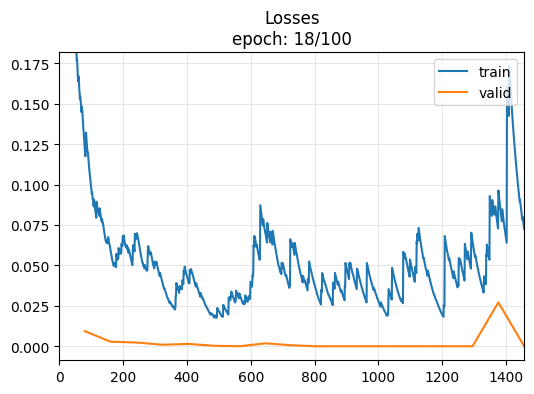

No improvement since epoch 3: early stopping


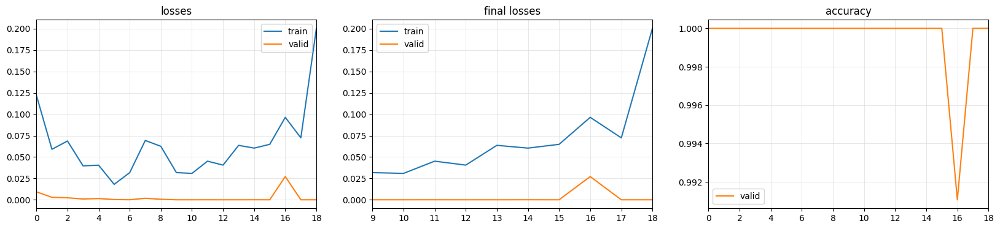

cuda


In [10]:
dls, X_train, X_test, y_test= data_preparation(X, y)
# Run the trainer function only if CUDA is available
if 'cuda' in str(device):
    print('Start training...')
    learn_new = trainer(MiniRocket, dls)
# else:
#     learn_new = load_learner_all(path=f'{base_dir}/export/',
#                                dls_fname='dls', model_fname='model', learner_fname='learner')
    # train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)
print(device)

Validation Accuracy :1.00
Test Accuracy :0.99
Train Accuracy :1.00


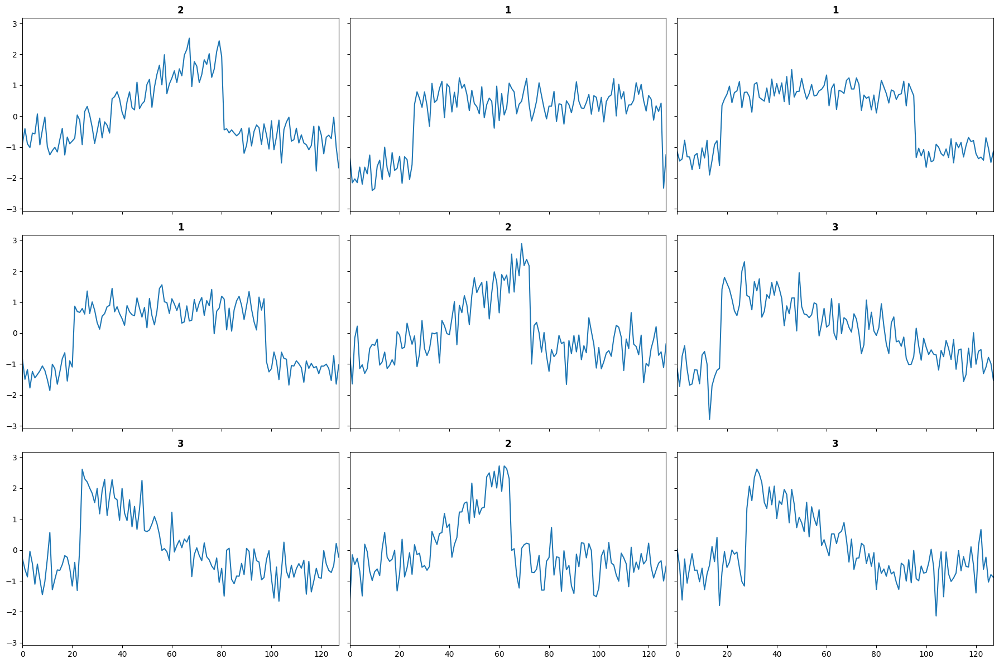

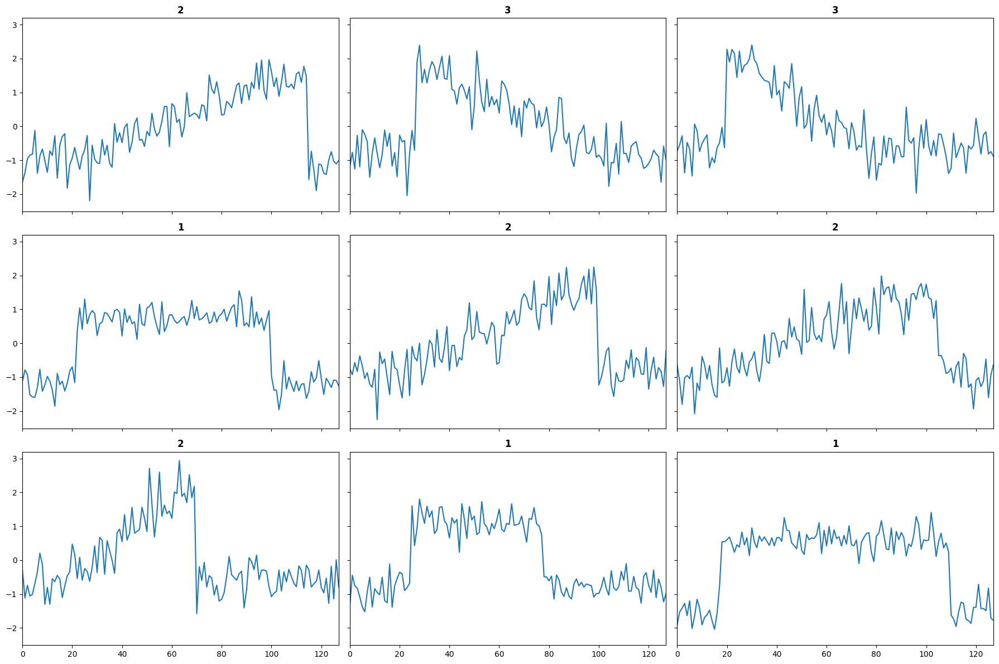

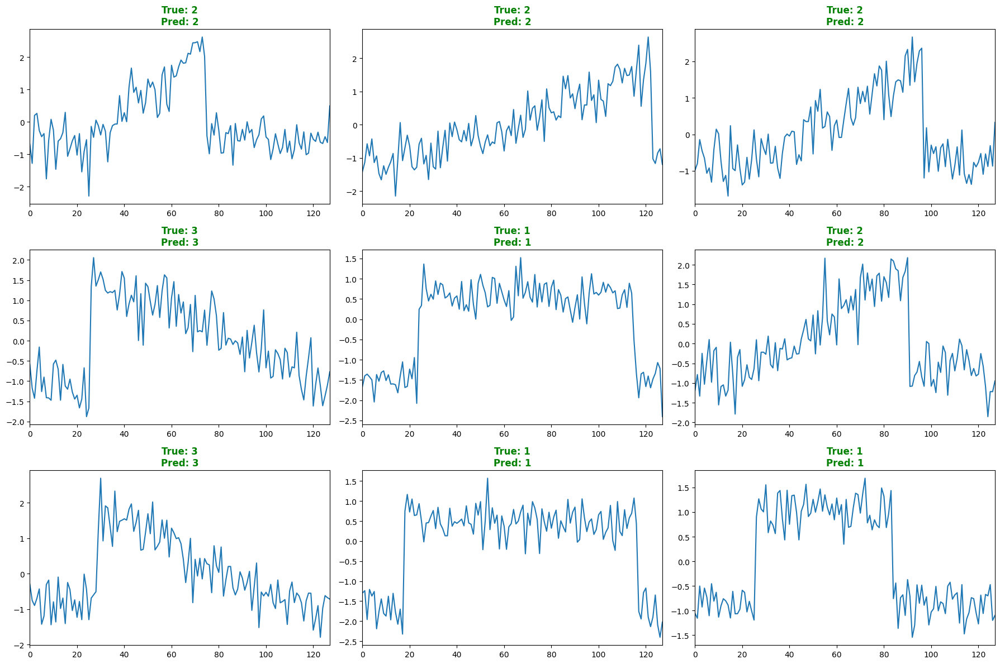

In [11]:
train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)

In [12]:
learn_new.summary()

not enough values to plot a chart


MiniRocket (Input shape: 8 x 1 x 128)
Layer (type)         Output Shape         Param #    Trainable 
                     8 x 9996            
MiniRocketFeatures                                             
Flatten                                                        
BatchNorm1d                               19992      True      
____________________________________________________________________________
                     8 x 3               
Linear                                    29991      True      
____________________________________________________________________________

Total params: 49,983
Total trainable params: 49,983
Total non-trainable params: 0

Optimizer used: <function Adam at 0x00000210ECCE68E0>
Loss function: FlattenedLoss of CrossEntropyLoss()

Model unfrozen

Callbacks:
  - TrainEvalCallback
  - CastToTensor
  - Recorder
  - ProgressCallback
  - SaveModelCallback
  - EarlyStoppingCallback
  - ShowGraph

In [13]:
class_labels = ['Cylinder','Bell','Funnel']

In [14]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

### Apply LOMATCE (LOcal Model-Agnostic Time-series Classifers Explanation)
LOMATCE is a novel Explainable AI (XAI) method designed specifically for time series classifiers. It generates explanations that preserve the temporal characteristics of time series data.

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15306 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10863 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36503 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37009 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.65
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


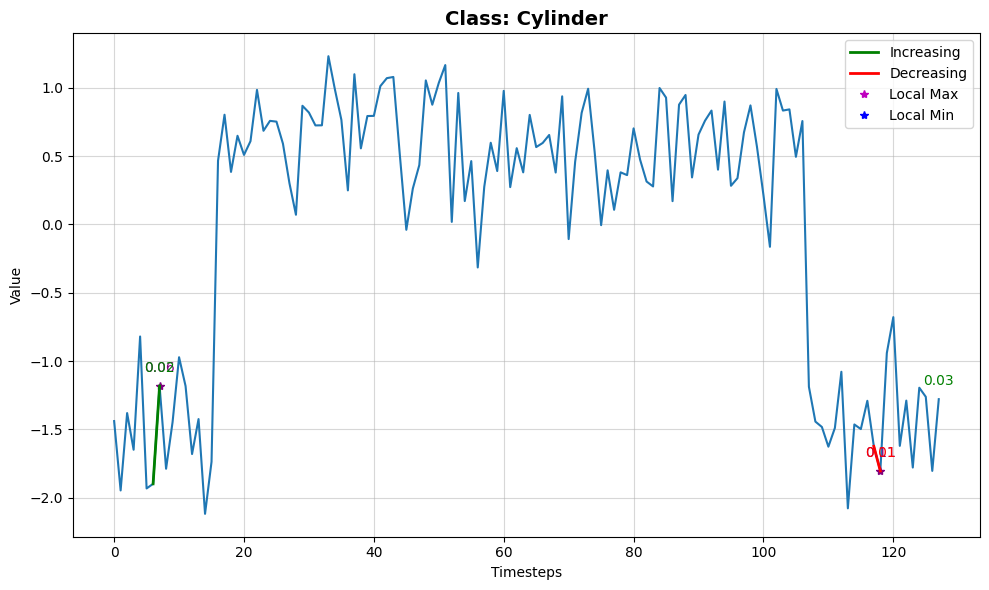

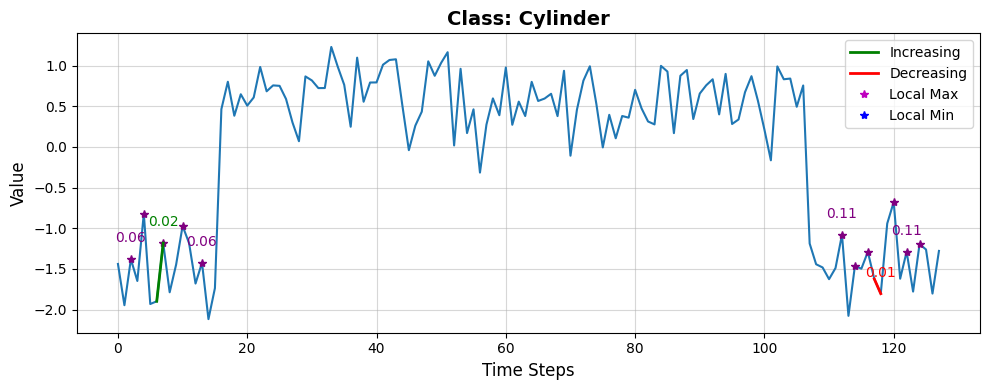

Prediction probability : tensor([0.9916, 0.0016, 0.0068])
Cylinder:                      0.9916
Bell:                      0.0016
Funnel:                      0.0068


In [15]:
origi_instance_0 = X_test[5] # Instance that is classified as Cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero', analysis=True)

In [16]:
explanation.analysis_metrics

{'Increasing_ch1': {'optimal_k': 19,
  'silhouette_score': 0.9296666030236119,
  'clustering_time': 7.016694068908691,
  'n_samples': 15306,
  'n_jobs': 5},
 'Decreasing_ch1': {'optimal_k': 19,
  'silhouette_score': 0.9593290689468907,
  'clustering_time': 2.0816855430603027,
  'n_samples': 10863,
  'n_jobs': 5},
 'LocalMax_ch1': {'optimal_k': 3,
  'silhouette_score': 0.6880175513475979,
  'clustering_time': 7.805466175079346,
  'n_samples': 36503,
  'n_jobs': 5},
 'LocalMin_ch1': {'optimal_k': 3,
  'silhouette_score': 0.7046246849085902,
  'clustering_time': 6.047325611114502,
  'n_samples': 37009,
  'n_jobs': 5}}

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (501, 1, 128)
INFO:lomatce.explainer:Processing events for 501 instances


Running on 8/20 CPU cores
Testing up to 20 clusters (adaptive based on 8087 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 8/20 CPU cores
Testing up to 20 clusters (adaptive based on 6315 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 8/20 CPU cores
Testing up to 20 clusters (adaptive based on 18167 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 8/20 CPU cores
Testing up to 20 clusters (adaptive based on 18631 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (501, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 501
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.87
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.18
INFO:lomatce.explainer:Model Type: Ridge


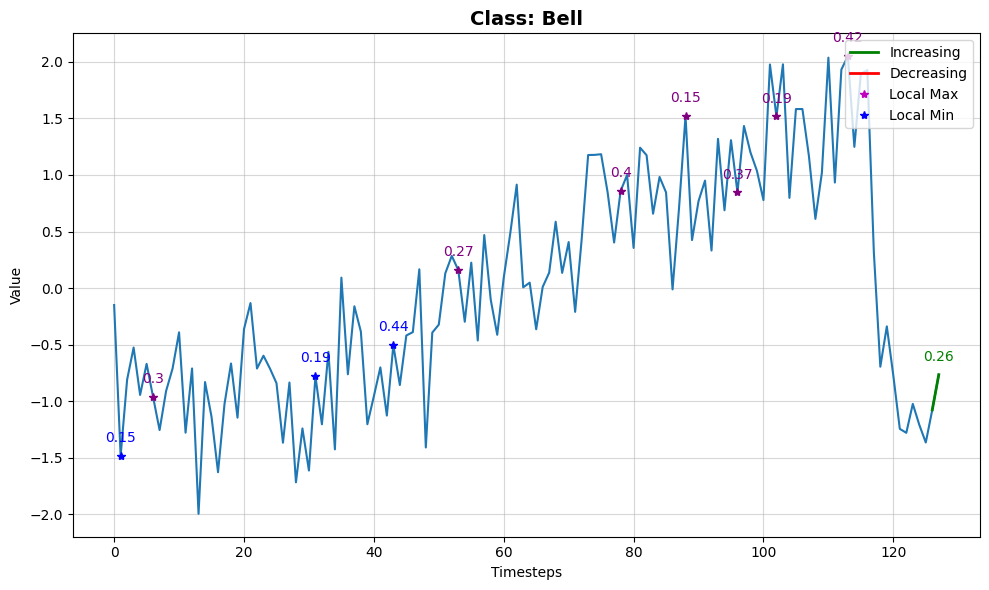

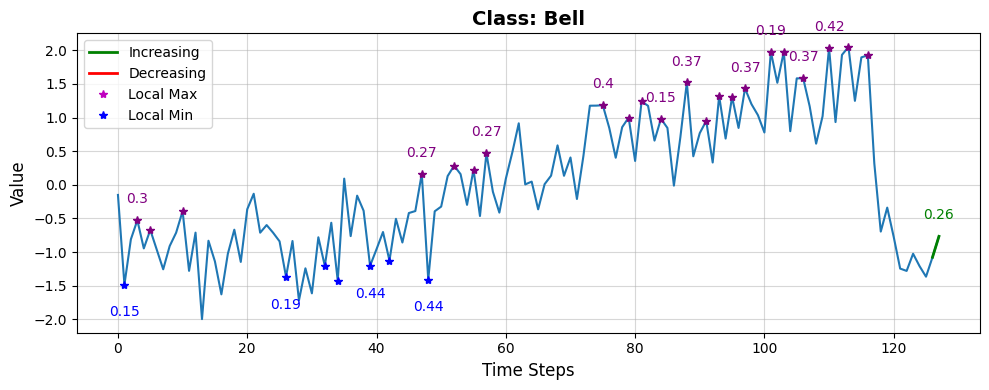

Prediction probability : tensor([6.4422e-03, 9.9343e-01, 1.2483e-04])
Cylinder:                      0.0064
Bell:                      0.9934
Funnel:                      0.0001


In [17]:
origi_instance_0 = X_test[7] # Instance that is classified as Bell
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=500, top_n=15, class_names=class_labels, replacement_method='zero',n_jobs=8)


📊 Visual 1: Cluster centroids overlaid on the original time series.


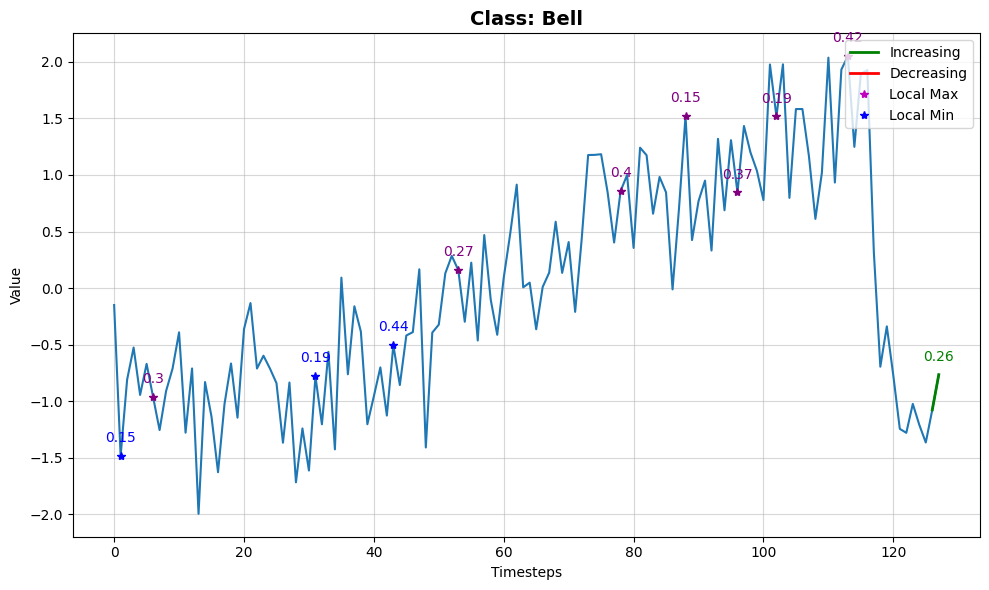

📌 Visual 2: Important events belong to the top-k clusters overlaid on the original time series.


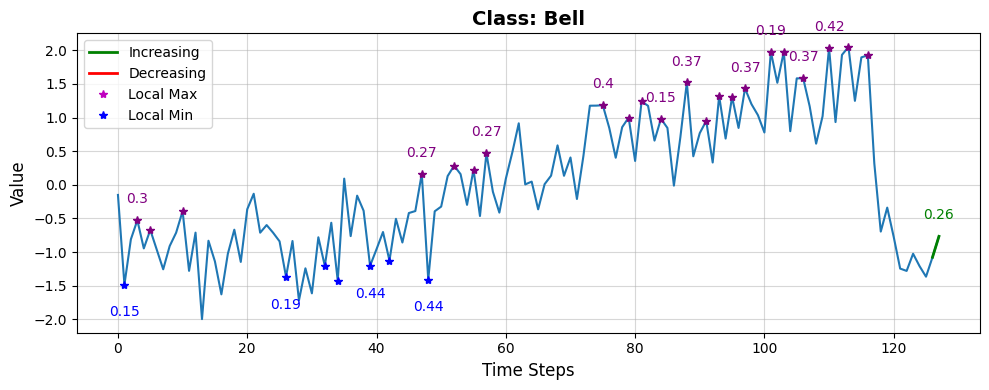

🧠 Explanation Summary:
• Local prediction (interpretable model): 1.1836
• Black-box model prediction: 1 or 'Bell'
• Local fidelity score (R²): 0.8744

 Class Probabilities (from black-box model):
Cylinder:                      0.0064
Bell:                      0.9934
Funnel:                      0.0001


In [18]:
explanation.visualise(origi_instance_0)

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17724 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18726 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29906 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29935 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.83
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.15
INFO:lomatce.explainer:Model Type: Ridge


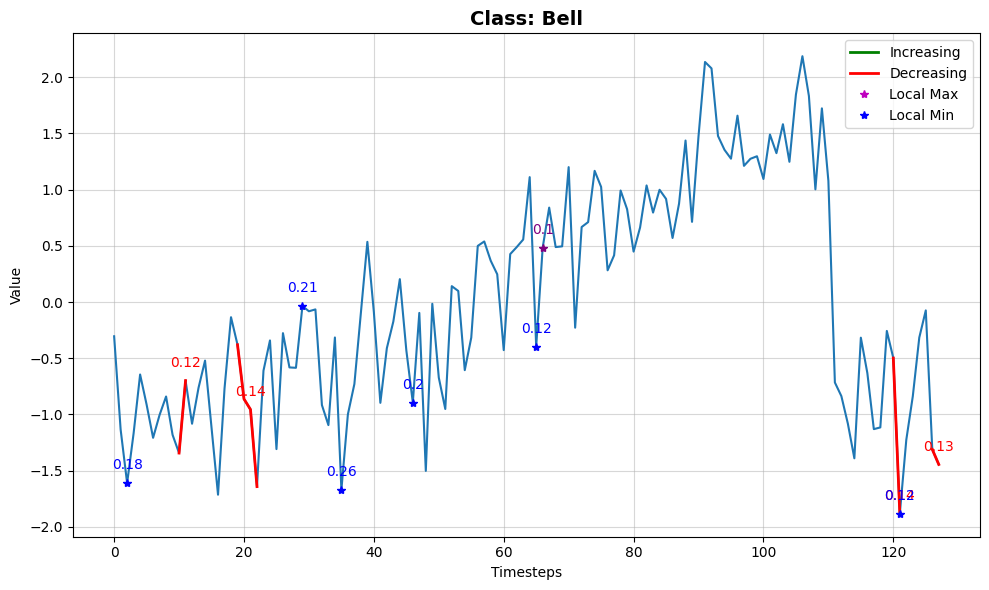

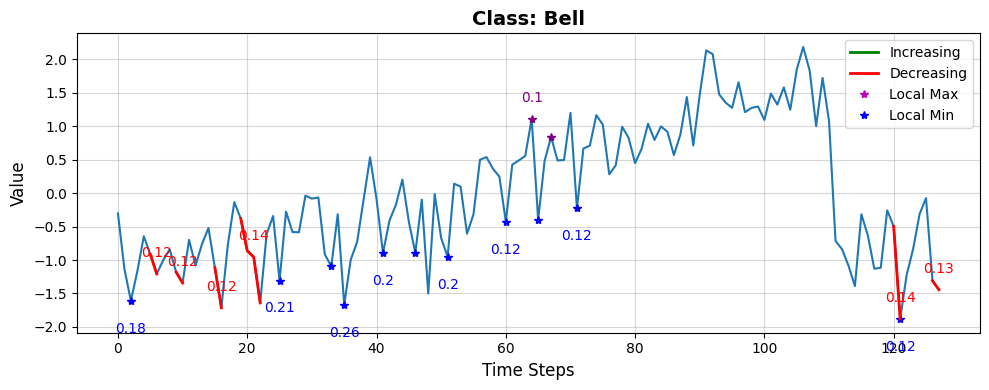

Prediction probability : tensor([2.1846e-03, 9.9762e-01, 1.9105e-04])
Cylinder:                      0.0022
Bell:                      0.9976
Funnel:                      0.0002


In [19]:
origi_instance_2 = X_test[16] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11601 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13265 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40755 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 41709 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 1.06
INFO:lomatce.explainer:Model Type: Ridge


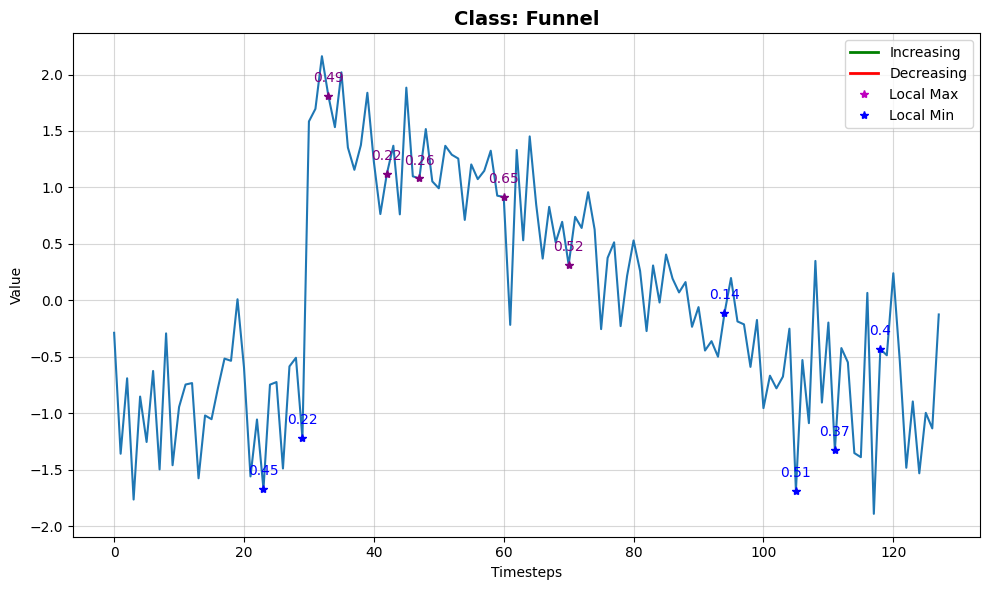

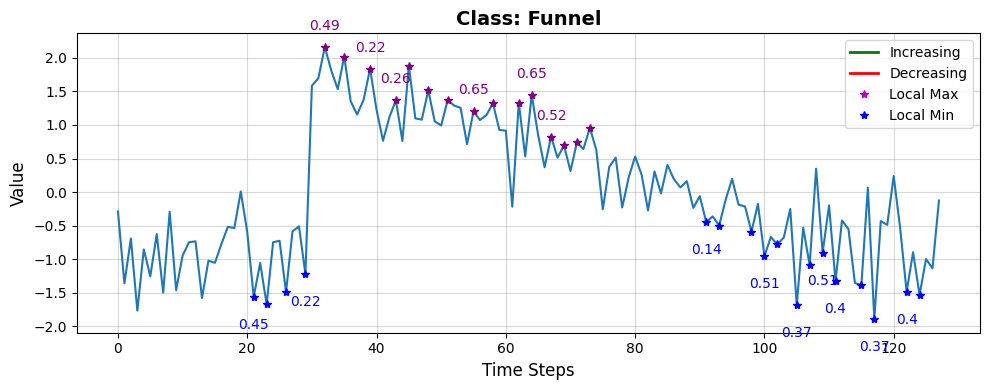

Prediction probability : tensor([3.4738e-02, 1.7365e-04, 9.6509e-01])
Cylinder:                      0.0347
Bell:                      0.0002
Funnel:                      0.9651


In [20]:
origi_instance_3 = X_test[3] # Instance that is classified as Funnel
explanation = lomatce_explainer.explain_instance(origi_instance_3, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

In [21]:
test_preds[0:10]

tensor([0, 0, 1, 2, 0, 0, 2, 1, 0, 0])

##### IG was not applied to MiniRocket because Integrated Gradients requires gradient information with respect to the input, while MiniRocket is a feature-transform-based classifier rather than an end-to-end differentiable neural network.

### LIME


🔍 Explaining instance 0 — Predicted class: Cylinder


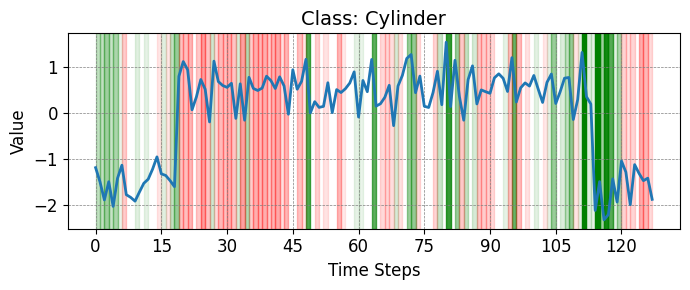


🔍 Explaining instance 1 — Predicted class: Cylinder


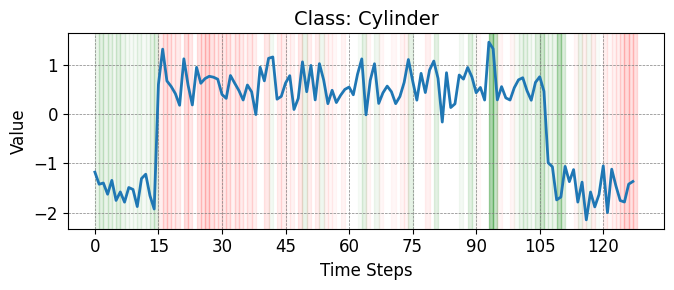


🔍 Explaining instance 2 — Predicted class: Bell


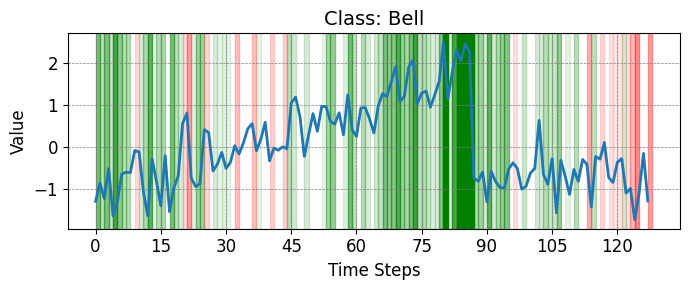


🔍 Explaining instance 3 — Predicted class: Funnel


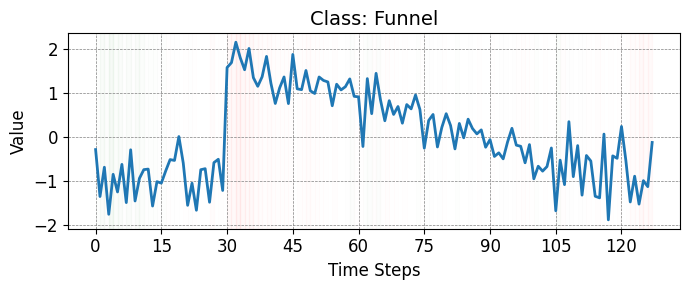


🔍 Explaining instance 4 — Predicted class: Cylinder


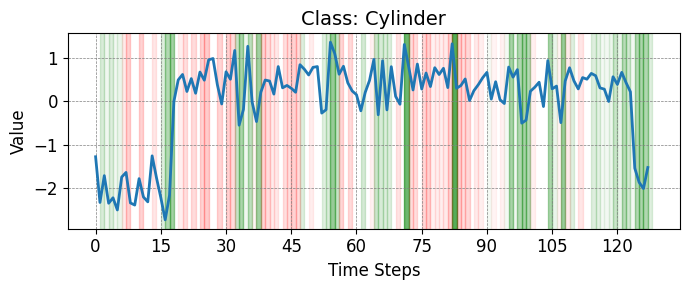

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import math
from lomatce.lime_timeseries import LimeTimeSeriesExplainer
import logging
logging.getLogger().setLevel(logging.WARNING) 

# Predict function that LIME will use
def predict_fn(data):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])  # Handle univariate case
    data_dl = test_loader.test_dataloader(learn_new, data)
    data_probas, _, _ = learn_new.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# Compute LIME and visualize importance
def compute_lime_importances(flat_series, predict_fn, num_slices=25, num_features=10, num_samples=5000, class_label=None, class_names=None):
    if num_slices is None:
        num_slices = len(flat_series)
    explainer = LimeTimeSeriesExplainer(class_names=class_names)

    exp = explainer.explain_instance(
        flat_series,
        predict_fn,
        num_features=num_features,
        num_samples=num_samples,
        num_slices=num_slices,
        replacement_method='total_mean'
    )

    values_per_slice = math.ceil(len(flat_series) / num_slices)
    segments_weights = exp.as_list()
    sorted_segments = sorted(segments_weights, key=lambda x: x[1], reverse=True)

    # Plot
    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)

    for feature, weight in sorted_segments:
        start = feature * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 20, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_label}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

    return sorted_segments

# 🔁 Explain multiple instances
num_instances_to_explain = 5  # Change to 6 or more if desired
for idx in range(num_instances_to_explain):
    label_index = int(test_preds[idx])  # Convert '0' or '1' string to int
    class_label = class_labels[label_index]

    instance = X_test[idx]  # Shape: (channels, time)
    flat_series = instance.flatten() if instance.ndim == 2 else instance  # Flatten if 2D

    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_label}")
    compute_lime_importances(
        flat_series,
        predict_fn,
        num_slices=None,
        num_features=96,
        num_samples=5000,
        class_label=class_label,
        class_names=class_labels
    )


### SHAP


🔍 Explaining instance 0 — Predicted class: Cylinder


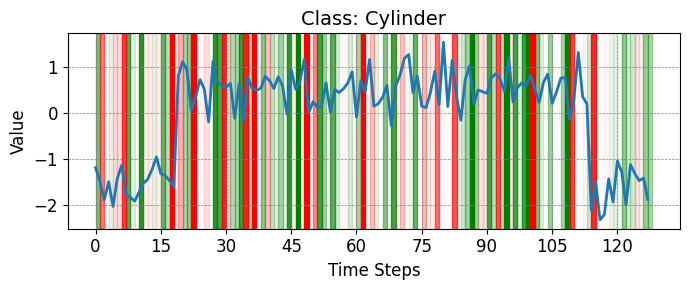


🔍 Explaining instance 1 — Predicted class: Cylinder


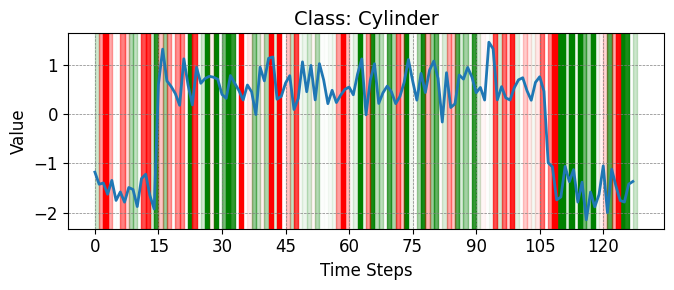


🔍 Explaining instance 2 — Predicted class: Bell


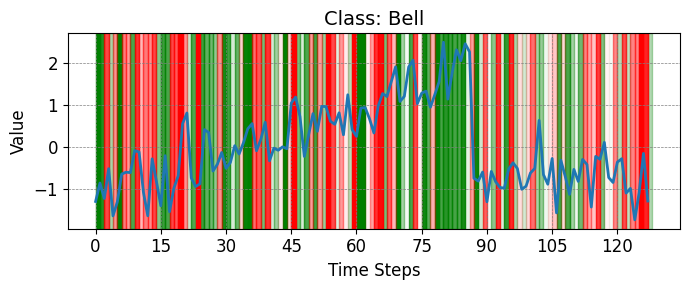


🔍 Explaining instance 3 — Predicted class: Funnel


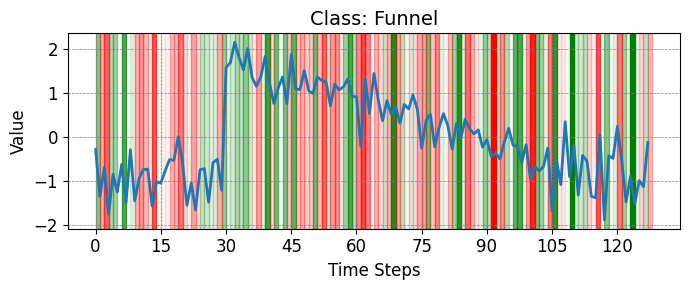


🔍 Explaining instance 4 — Predicted class: Cylinder


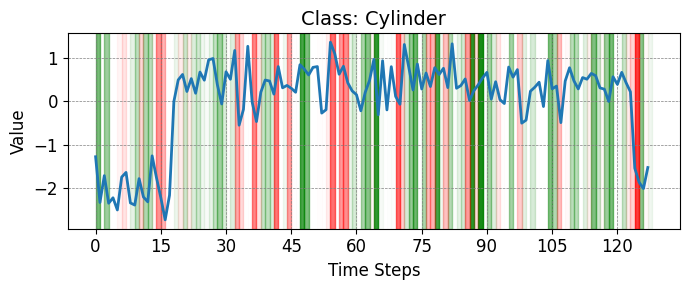

In [24]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import math

# --- 1. Segmenting Function ---
def create_segments(X, num_segments=None):
    num_samples, num_channels, sequence_length = X.shape
    if num_segments is None:
        num_segments = sequence_length
    segment_length = sequence_length // num_segments
    return num_segments, segment_length

# --- 2. Predict Function for SHAP ---
def predict_fn(masks, instance, background_data, num_segments, segment_length, learner):
    masked_inputs = []
    for mask in masks:
        masked_instance = instance.copy()
        for seg_idx in range(num_segments):
            start = seg_idx * segment_length
            end = (seg_idx + 1) * segment_length
            if mask[seg_idx] == 0:
                random_idx = np.random.randint(0, background_data.shape[0])
                background_segment = background_data[random_idx, :, start:end]
                masked_instance[0, :, start:end] = background_segment
        masked_inputs.append(masked_instance[0])
    masked_inputs = np.stack(masked_inputs)  # (num_masks, channels, time)
    data_dl = test_loader.test_dataloader(learner, masked_inputs)
    data_probas, _, _ = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# --- 3. Plotting SHAP Segment Importance ---
def plot_segment_importance(flat_series, shap_values, segment_length, class_name):
    num_segments = len(shap_values)
    flat_series = flat_series.flatten() if len(flat_series.shape) == 2 else flat_series
    values_per_slice = math.ceil(len(flat_series) / segment_length)
    sorted_segments = sorted(enumerate(shap_values), key=lambda x: x[1], reverse=True)

    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)
    
    for segment_idx, weight in sorted_segments:
        start = segment_idx * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 10, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_name}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

# --- 4. SHAP Explanation for Multiple Instances ---
# Set number of segments
num_segments, segment_length = create_segments(X_train, num_segments=None)

# Sample background for masking
background_data = X_train[np.random.choice(len(X_train), min(100, len(X_train)), replace=False)]

# Loop over multiple test instances
num_instances_to_explain = 5

for idx in range(num_instances_to_explain):
    instance_to_explain = X_test[idx:idx+1]  # Shape: (1, C, T)
    label_index = int(test_preds[idx])
    class_name = class_labels[label_index]
    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_name}")
    # SHAP explainer setup
    predict_fn_shap = lambda masks: predict_fn(
        masks,
        instance=instance_to_explain,
        background_data=background_data,
        num_segments=num_segments,
        segment_length=segment_length,
        learner=learn_new
    )

    explainer = shap.Explainer(predict_fn_shap, np.zeros((1, num_segments)))
    shap_values = explainer.shap_values(np.ones((1, num_segments)))
    
    # Extract SHAP values for the predicted class
    if isinstance(shap_values, list):
        shap_value = shap_values[label_index][0]
    else:
        shap_value = shap_values[0, :, label_index]

    shap_values_flat = np.array(shap_value).flatten()
    sorted_indices = np.argsort(-np.abs(shap_values_flat))
    sorted_shap_values = shap_values_flat[sorted_indices]
    important_time_steps = sorted_indices

    # Plot the explanation
    flat_series = instance_to_explain.reshape(1, instance_to_explain.shape[2])
    plot_segment_importance(flat_series, shap_values_flat, num_segments, class_name)


### SP-LOMATCE

In [25]:
from lomatce.sp_lomatce import SPLOMATCE

In [26]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

In [27]:
# Initialize SP-LOMATCE
splomatce_explainer = SPLOMATCE(class_labels=class_labels, dataset_name=dataset_name.upper(), lomatce_explainer=lomatce_explainer, predict_fn=lambda data: predict_fn(data, learn_new), output_dir= base_dir)



=== Running SP-LOMATCE for class Cylinder ===
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14321 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15820 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37092 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36797 samples)
Optimal number of clusters for LocalMin_ch1: 3


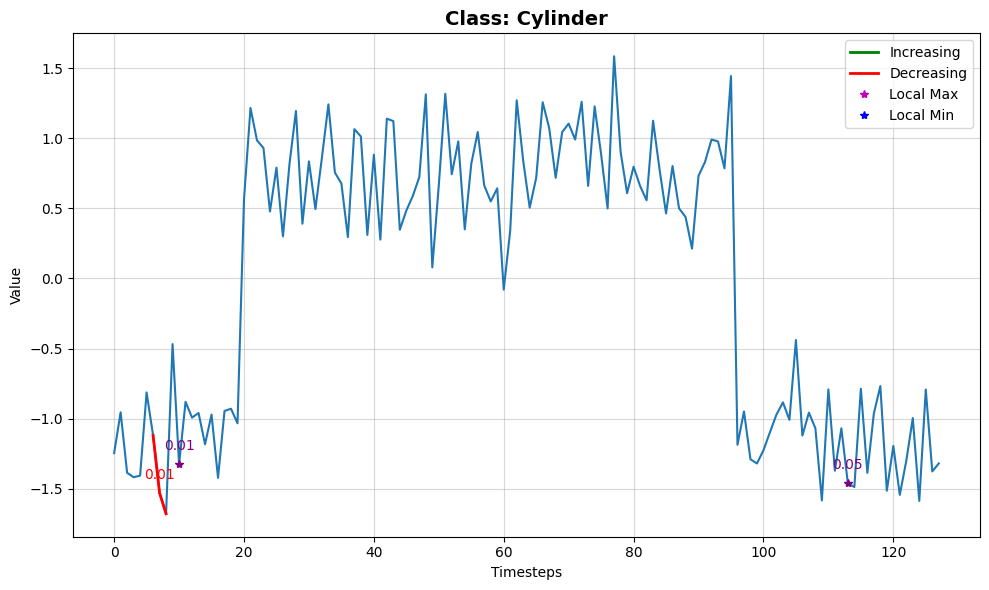

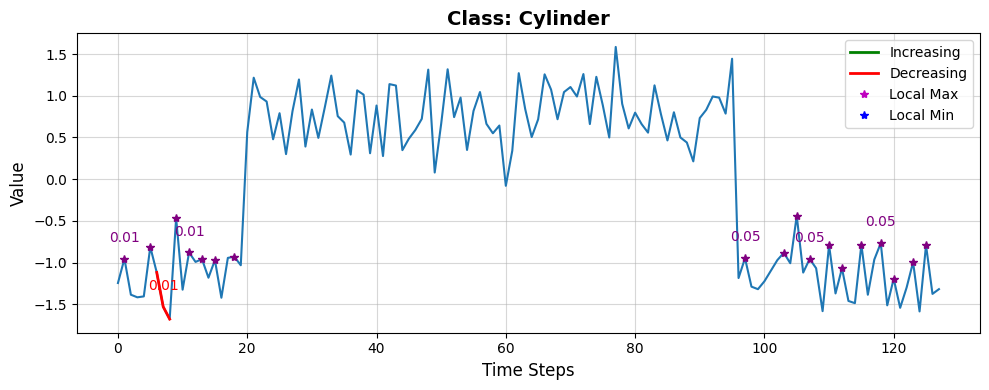

Prediction probability : tensor([0.9962, 0.0012, 0.0026])
Cylinder:                      0.9962
Bell:                      0.0012
Funnel:                      0.0026
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 21954 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13280 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35462 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34946 samples)
Optimal number of clusters for LocalMin_ch1: 19


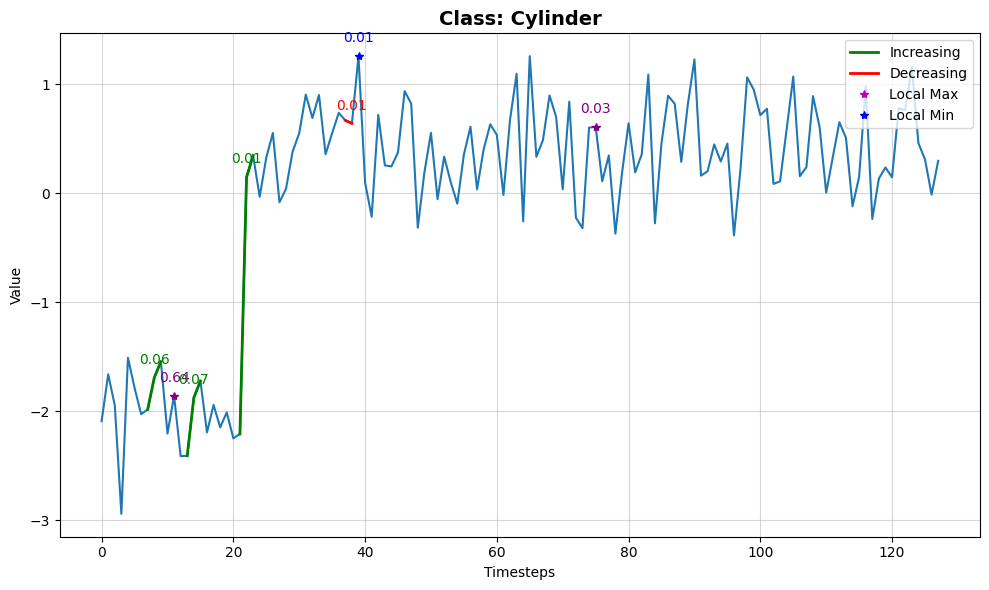

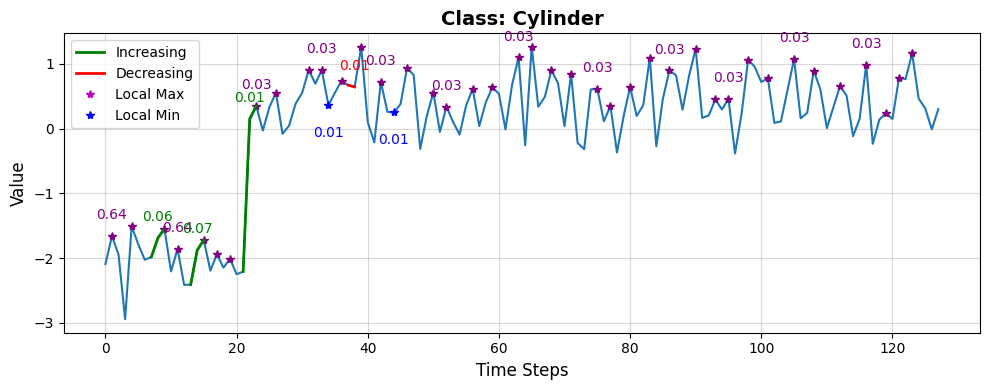

Prediction probability : tensor([0.9902, 0.0080, 0.0017])
Cylinder:                      0.9902
Bell:                      0.0080
Funnel:                      0.0017
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16827 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11578 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36156 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36284 samples)
Optimal number of clusters for LocalMin_ch1: 3


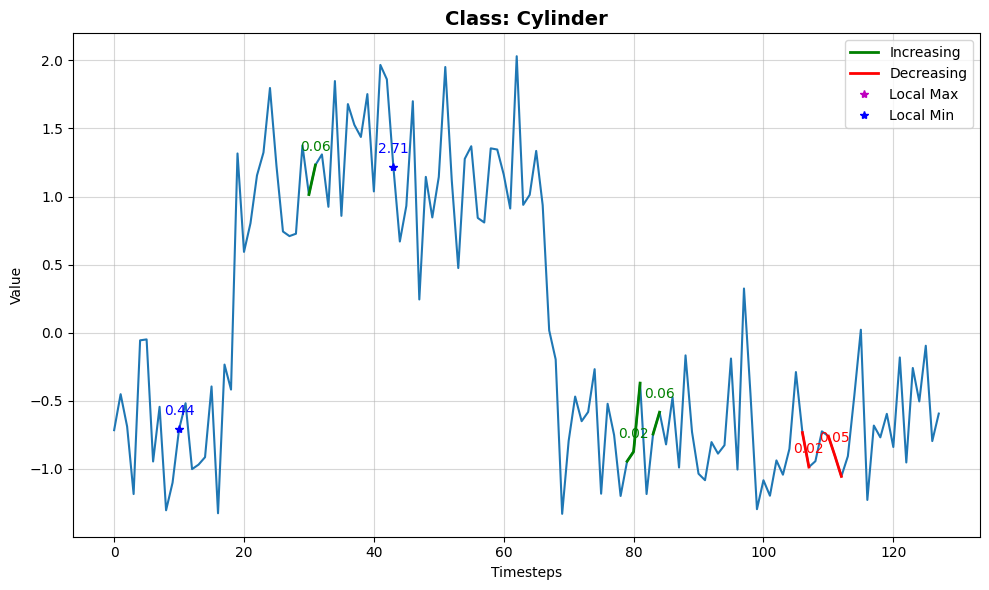

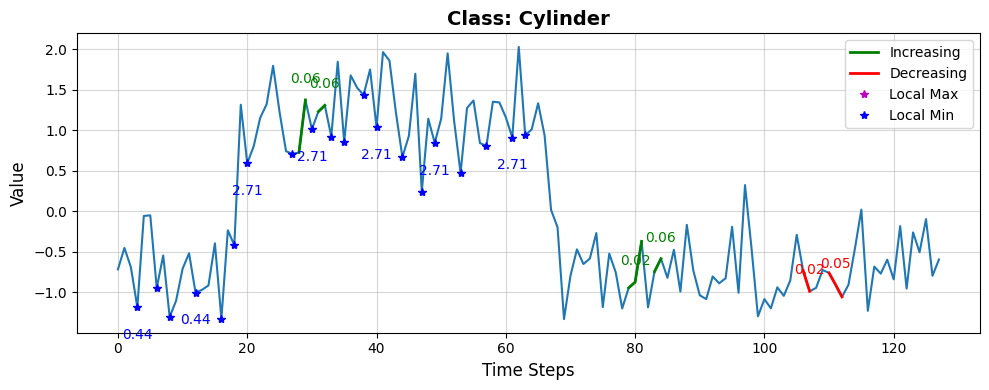

Prediction probability : tensor([0.7621, 0.0393, 0.1986])
Cylinder:                      0.7621
Bell:                      0.0393
Funnel:                      0.1986
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13477 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19515 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34563 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33024 samples)
Optimal number of clusters for LocalMin_ch1: 18


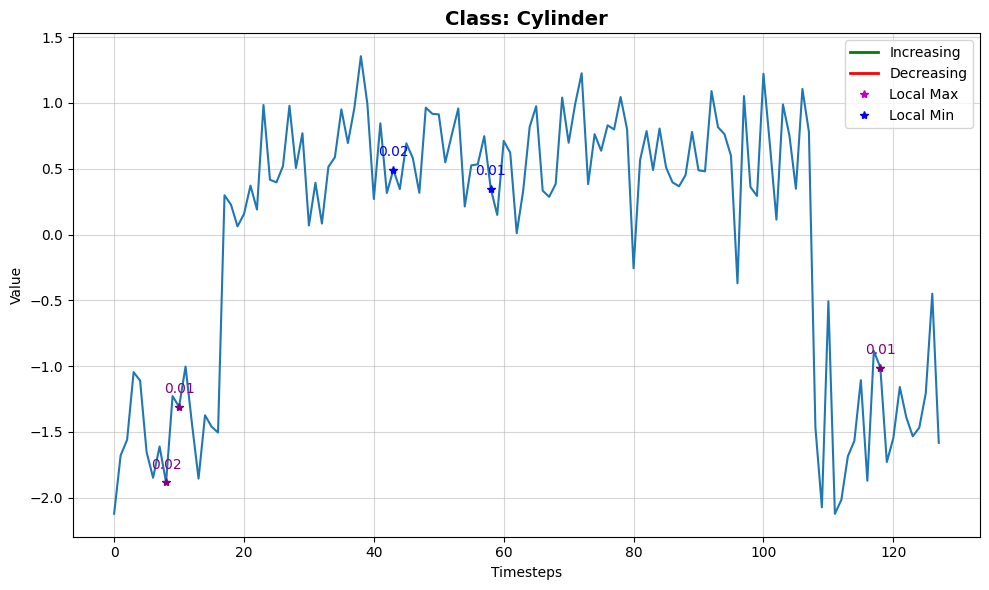

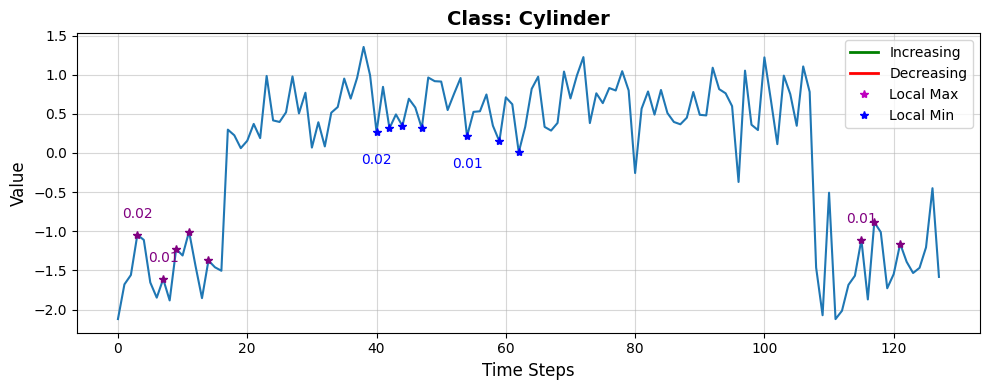

Prediction probability : tensor([9.9815e-01, 1.5459e-03, 3.0337e-04])
Cylinder:                      0.9982
Bell:                      0.0015
Funnel:                      0.0003
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13433 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15273 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38330 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37858 samples)
Optimal number of clusters for LocalMin_ch1: 18


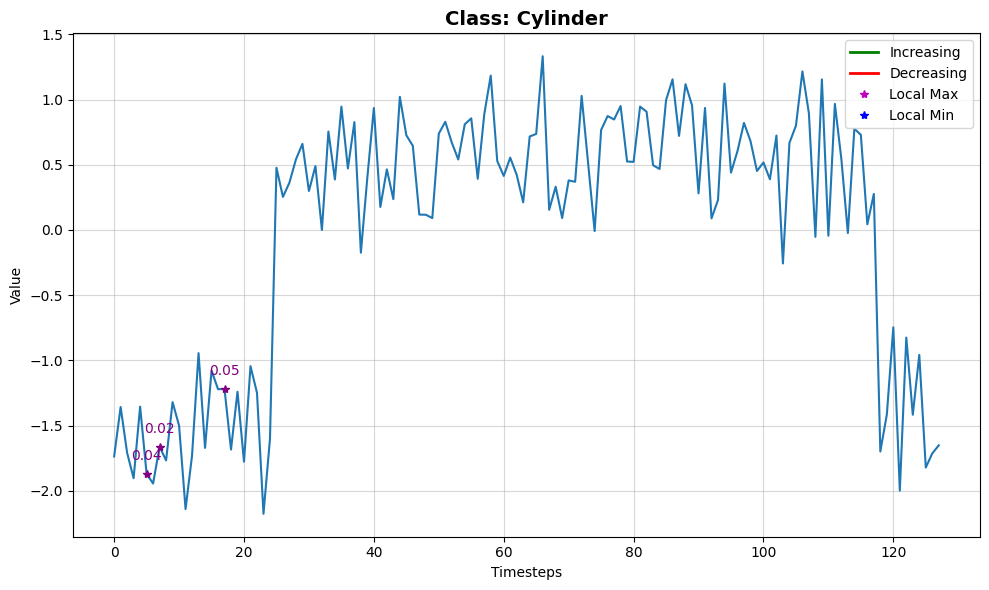

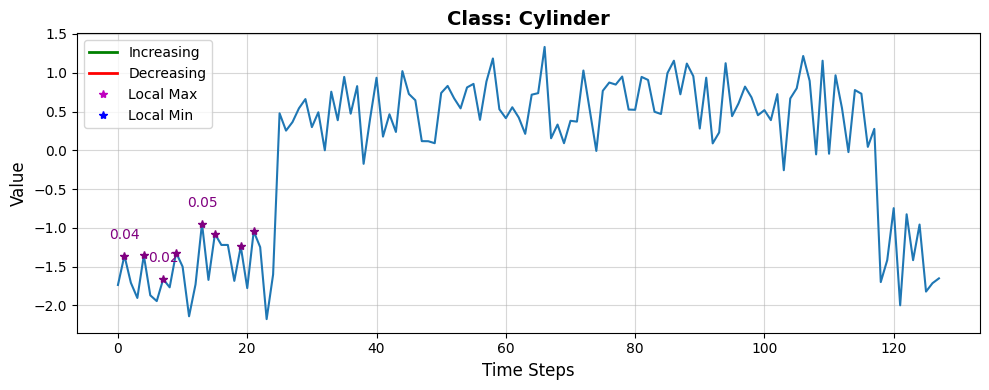

Prediction probability : tensor([9.9842e-01, 1.3000e-03, 2.7641e-04])
Cylinder:                      0.9984
Bell:                      0.0013
Funnel:                      0.0003
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15128 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12510 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36352 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35805 samples)
Optimal number of clusters for LocalMin_ch1: 19


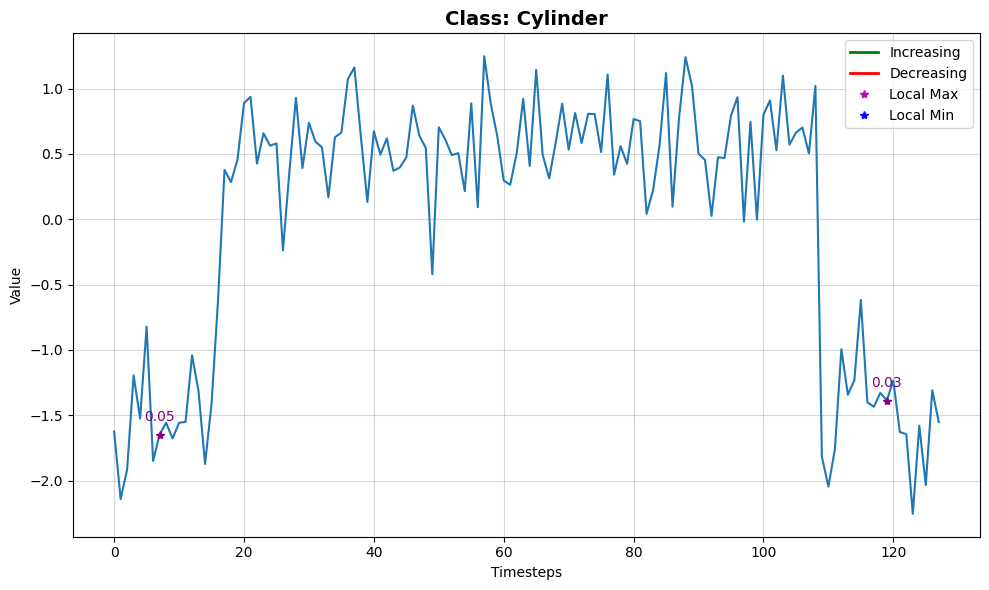

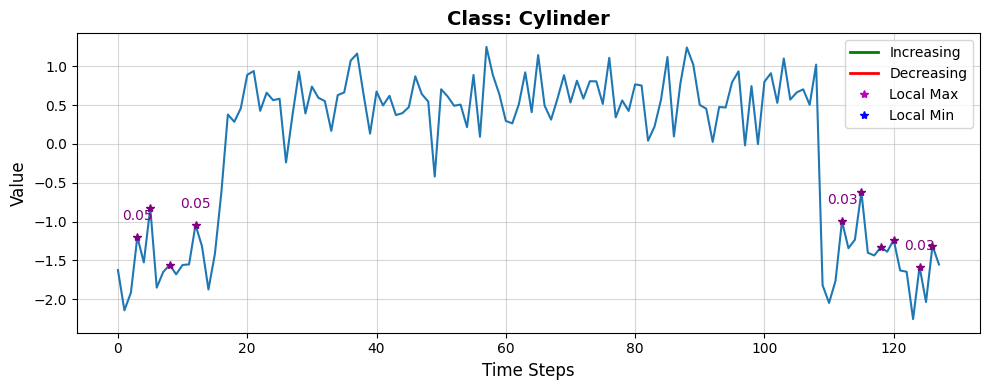

Prediction probability : tensor([0.9975, 0.0012, 0.0013])
Cylinder:                      0.9975
Bell:                      0.0012
Funnel:                      0.0013
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16081 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13408 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35926 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36967 samples)
Optimal number of clusters for LocalMin_ch1: 3


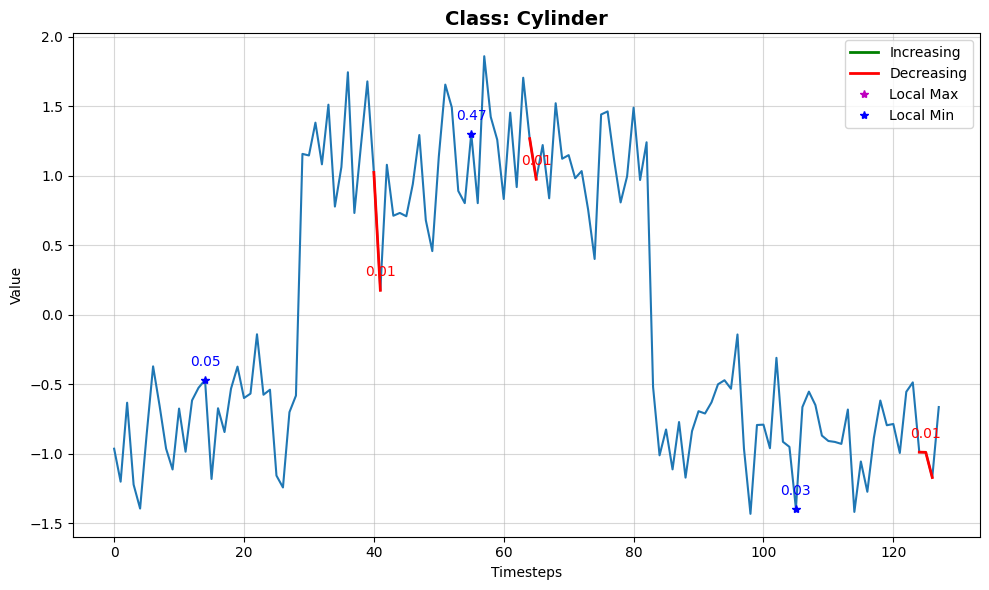

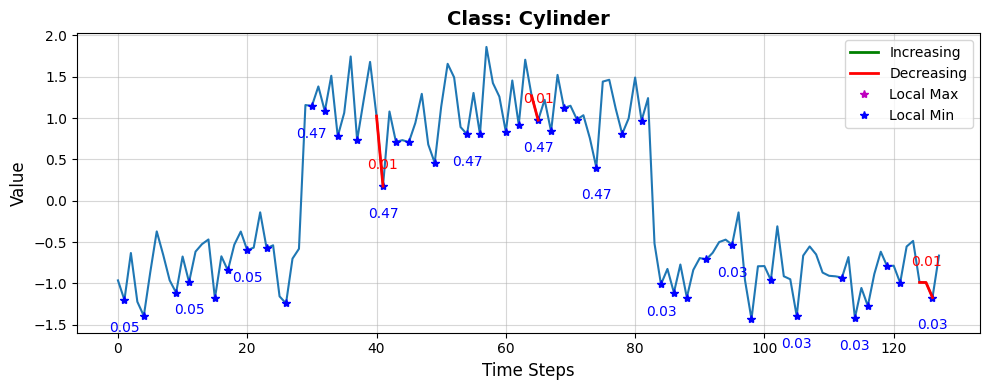

Prediction probability : tensor([0.9919, 0.0051, 0.0029])
Cylinder:                      0.9919
Bell:                      0.0051
Funnel:                      0.0029
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15111 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11005 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38811 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39917 samples)
Optimal number of clusters for LocalMin_ch1: 3


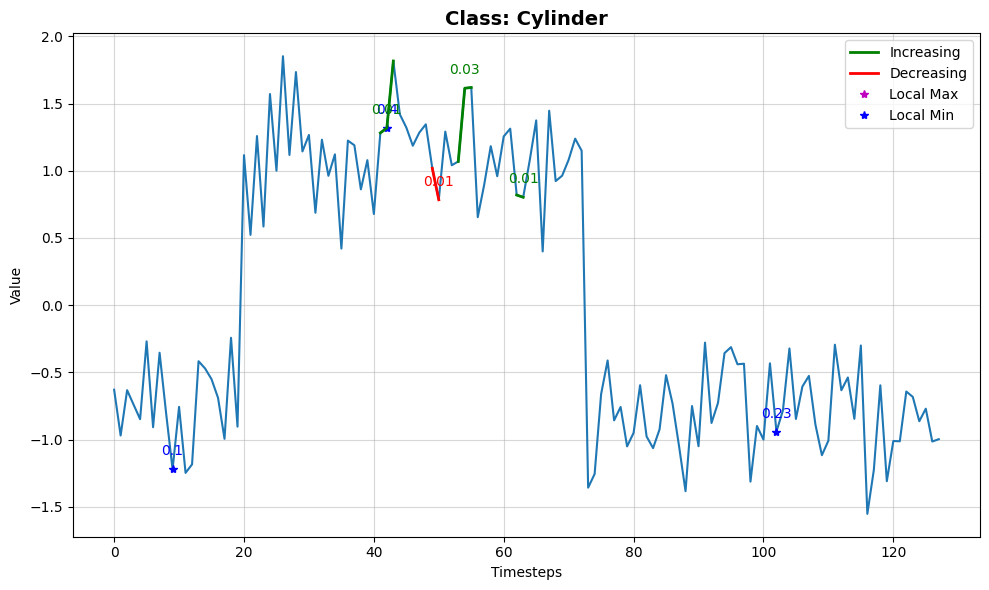

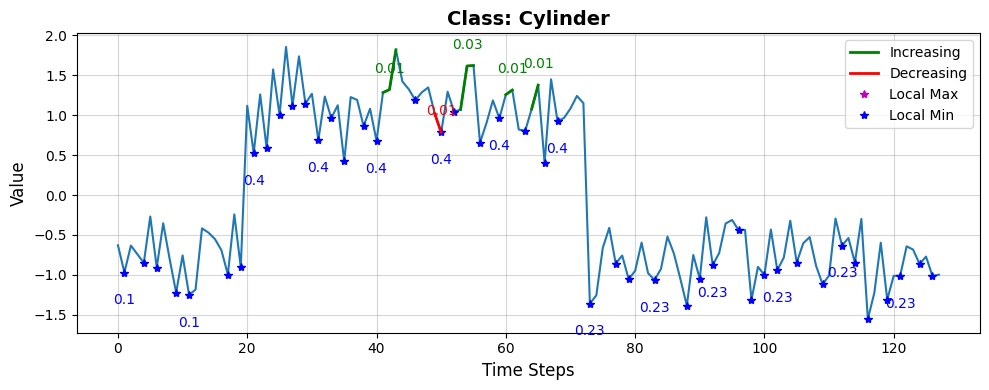

Prediction probability : tensor([9.9616e-01, 5.9025e-04, 3.2532e-03])
Cylinder:                      0.9962
Bell:                      0.0006
Funnel:                      0.0033
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16095 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12671 samples)
Optimal number of clusters for Decreasing_ch1: 15
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35090 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35228 samples)
Optimal number of clusters for LocalMin_ch1: 3


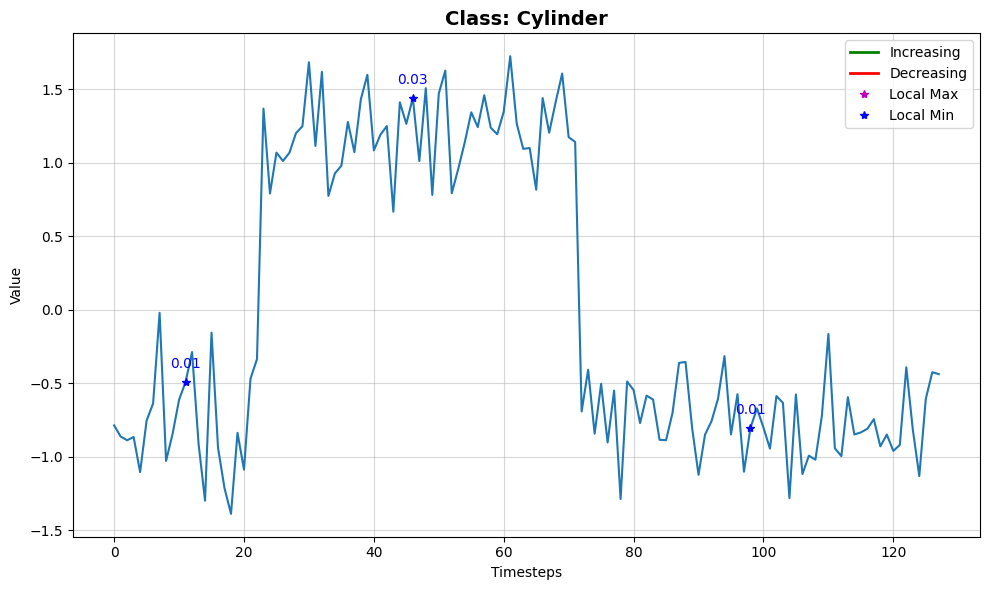

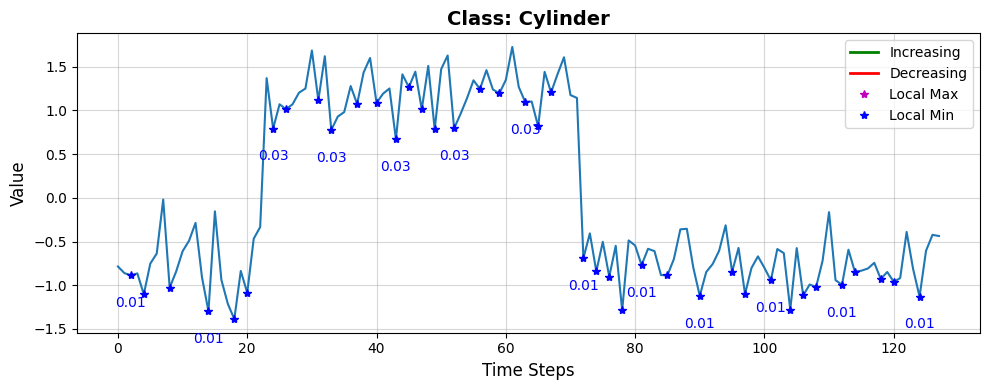

Prediction probability : tensor([9.9989e-01, 2.8376e-05, 8.2194e-05])
Cylinder:                      0.9999
Bell:                      0.0000
Funnel:                      0.0001
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 8402 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18062 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37738 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38034 samples)
Optimal number of clusters for LocalMin_ch1: 3


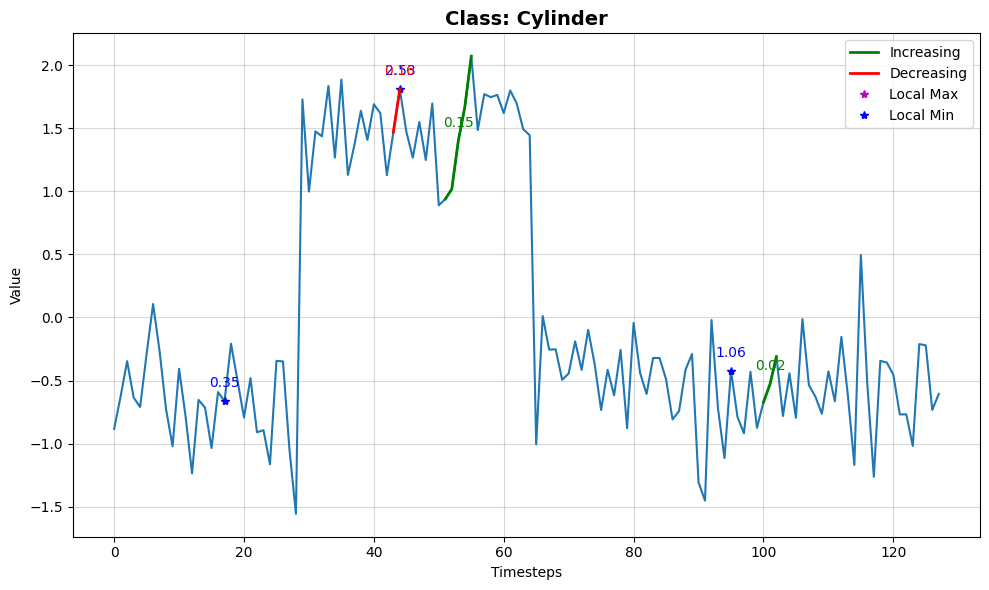

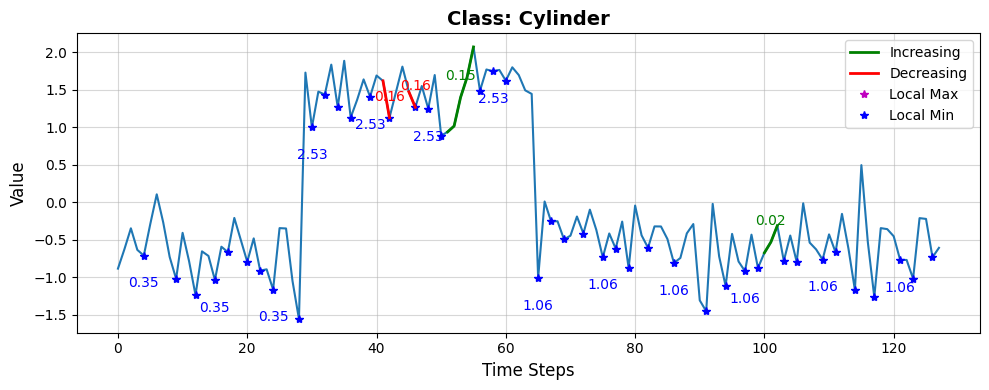

Prediction probability : tensor([0.9686, 0.0040, 0.0274])
Cylinder:                      0.9686
Bell:                      0.0040
Funnel:                      0.0274
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16063 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12341 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36142 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36194 samples)
Optimal number of clusters for LocalMin_ch1: 3


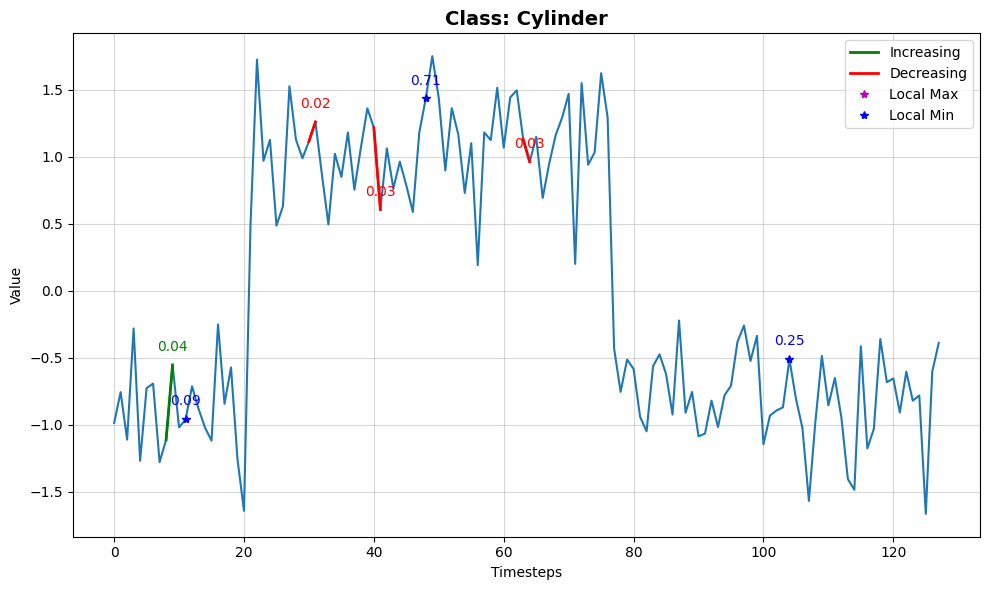

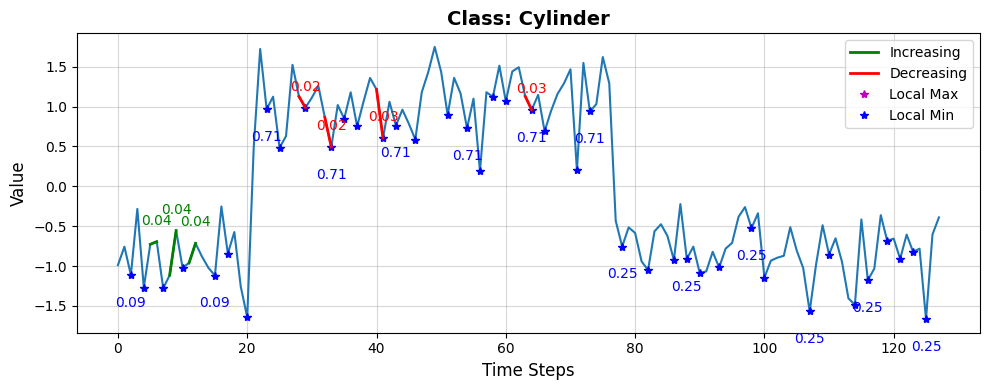

Prediction probability : tensor([0.9872, 0.0020, 0.0108])
Cylinder:                      0.9872
Bell:                      0.0020
Funnel:                      0.0108
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11842 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15268 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34433 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32904 samples)
Optimal number of clusters for LocalMin_ch1: 3


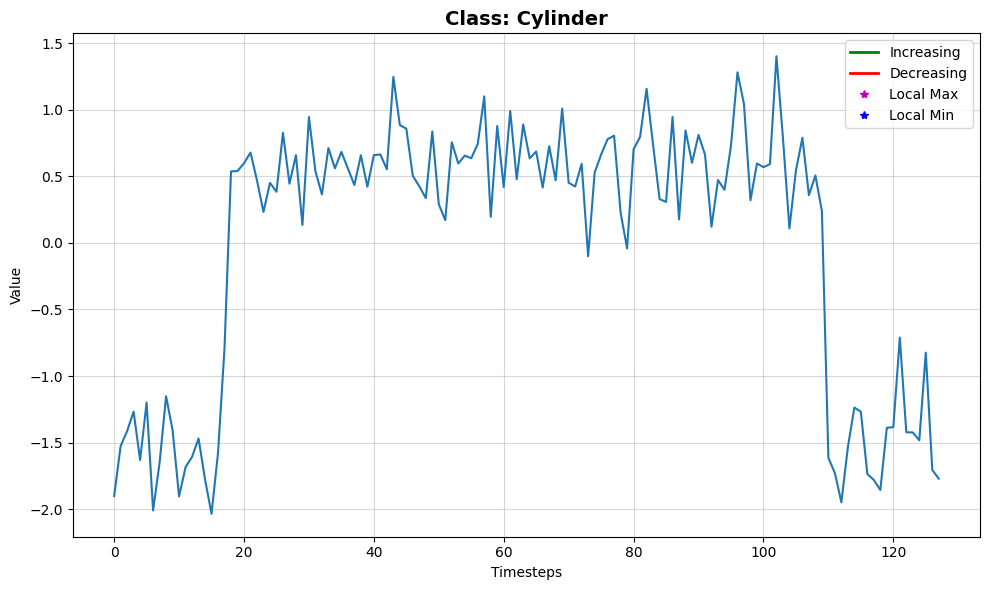

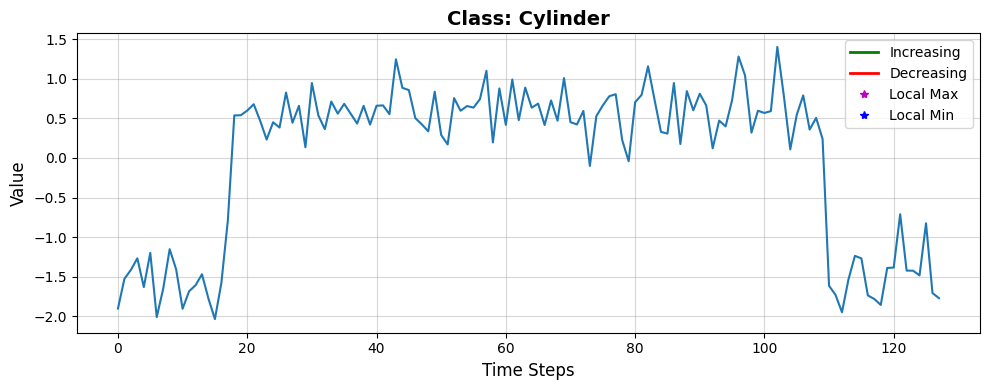

Prediction probability : tensor([9.9996e-01, 2.4871e-05, 1.5213e-05])
Cylinder:                      1.0000
Bell:                      0.0000
Funnel:                      0.0000
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17694 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12787 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34484 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33123 samples)
Optimal number of clusters for LocalMin_ch1: 3


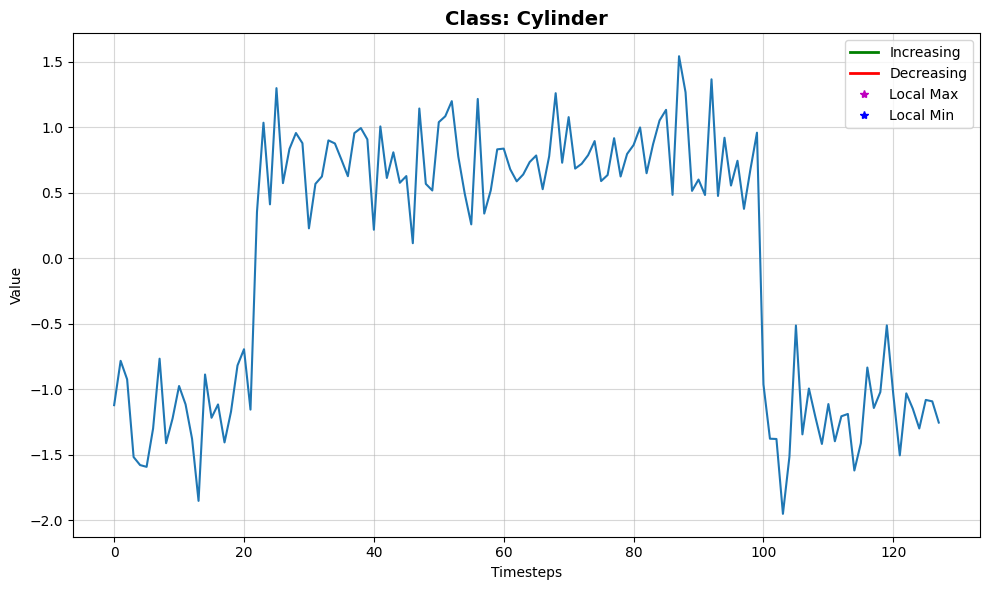

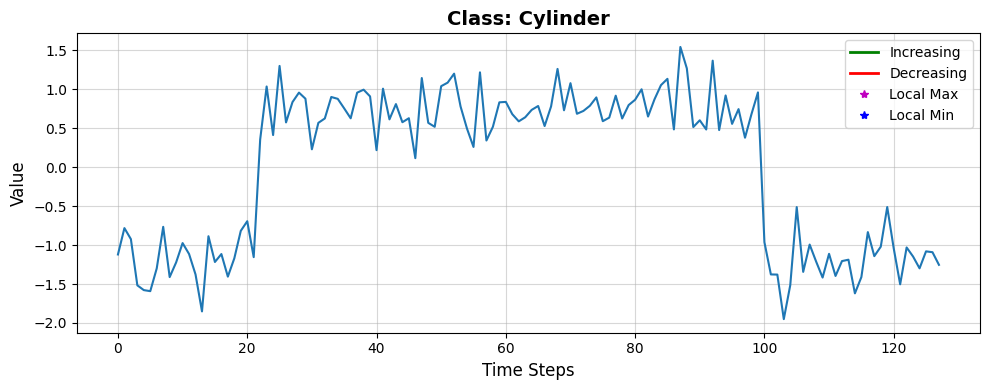

Prediction probability : tensor([9.9995e-01, 4.1263e-05, 1.2326e-05])
Cylinder:                      0.9999
Bell:                      0.0000
Funnel:                      0.0000
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13507 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13348 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39382 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39922 samples)
Optimal number of clusters for LocalMin_ch1: 2


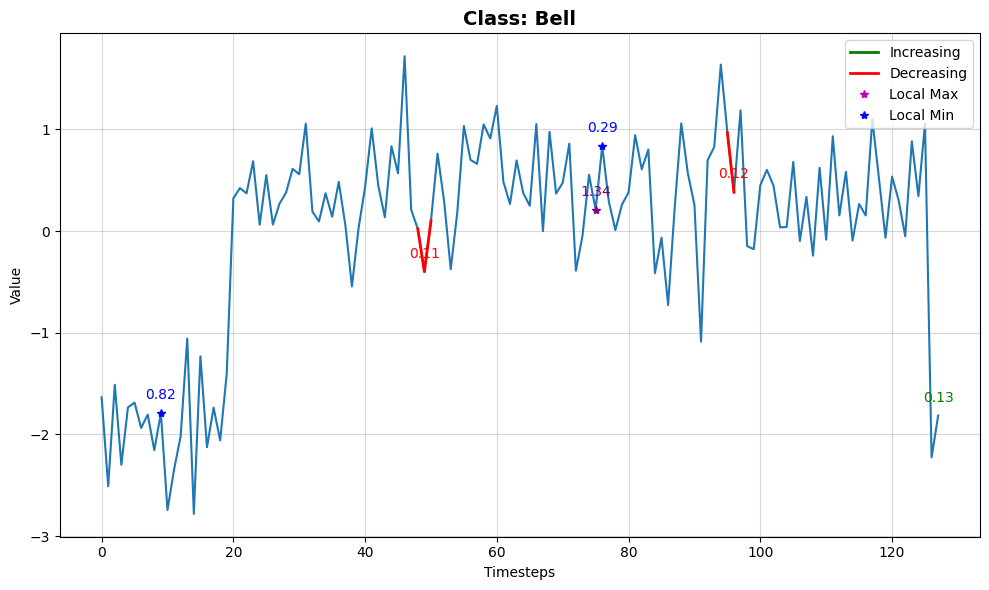

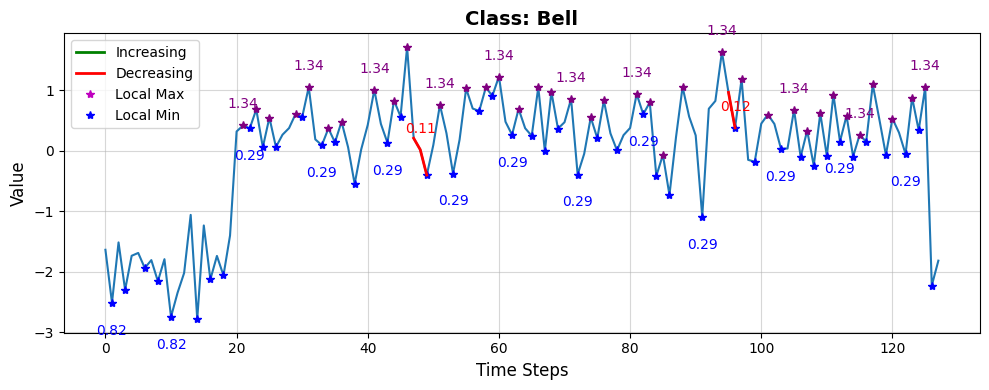

Prediction probability : tensor([0.1353, 0.6730, 0.1917])
Cylinder:                      0.1353
Bell:                      0.6730
Funnel:                      0.1917
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16138 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10859 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37651 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37518 samples)
Optimal number of clusters for LocalMin_ch1: 3


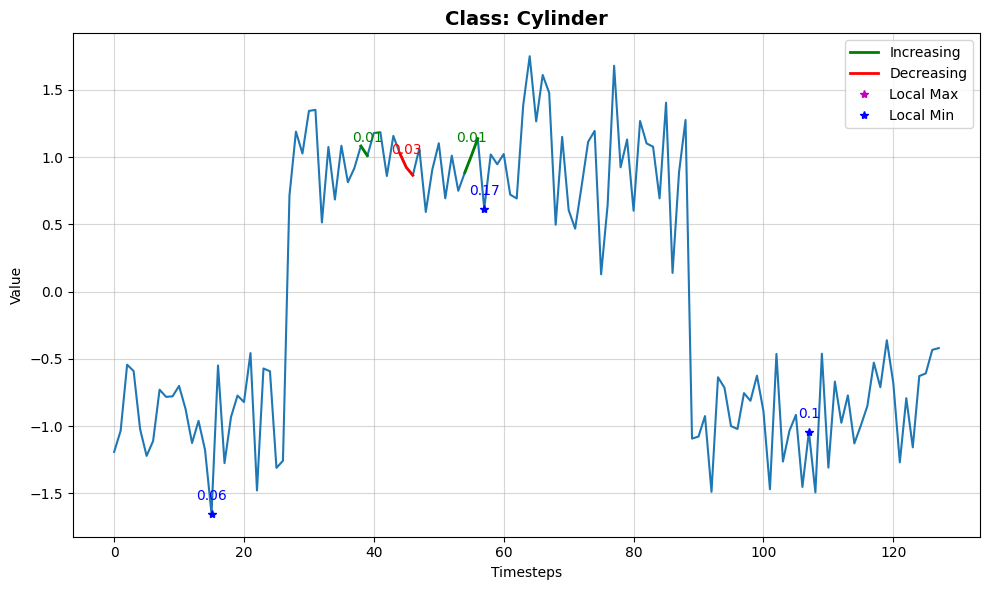

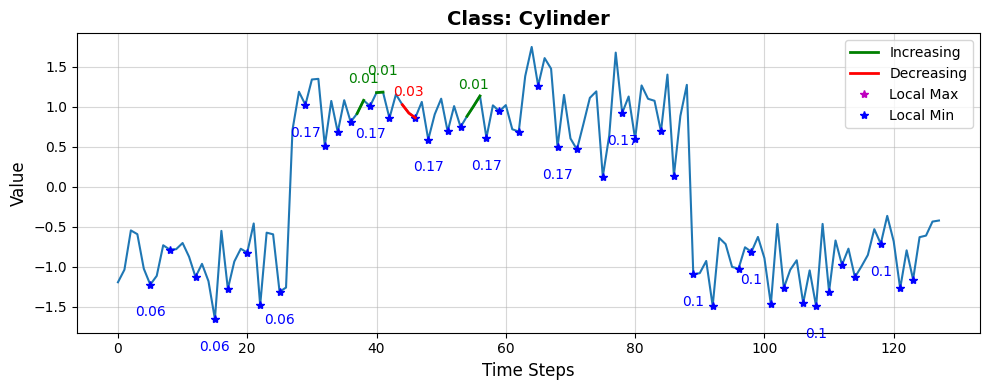

Prediction probability : tensor([9.9853e-01, 1.0910e-03, 3.8078e-04])
Cylinder:                      0.9985
Bell:                      0.0011
Funnel:                      0.0004

📈 Global Faithfulness (Avg Local Fidelity): 0.6580

=== Running SP-LOMATCE for class Bell ===
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16166 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15118 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35983 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36191 samples)
Optimal number of clusters for LocalMin_ch1: 19


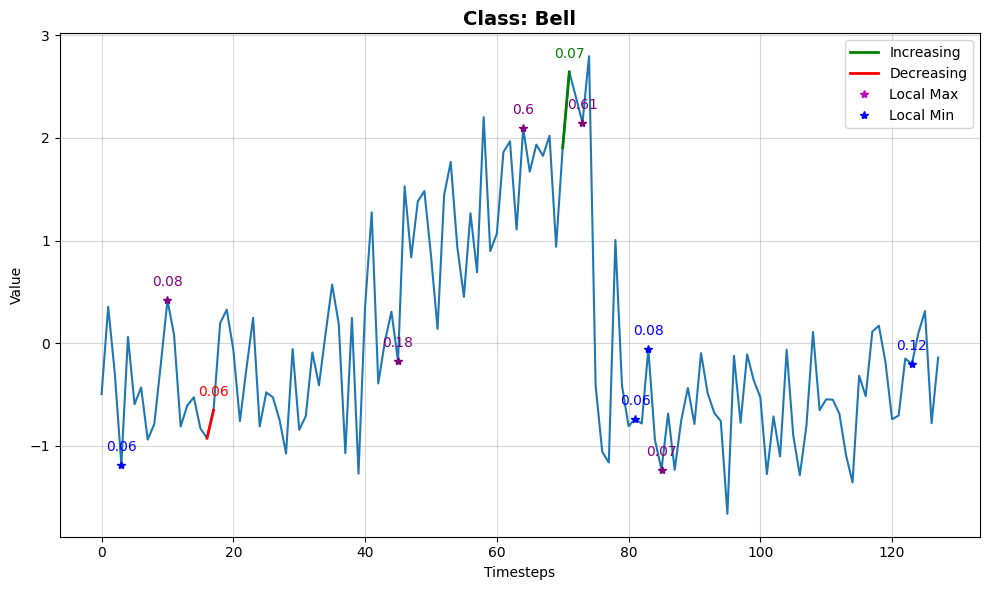

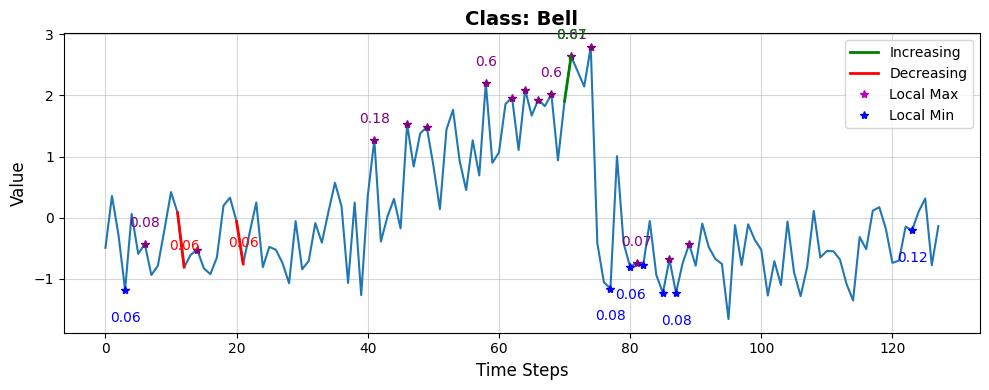

Prediction probability : tensor([3.5264e-05, 9.9717e-01, 2.7996e-03])
Cylinder:                      0.0000
Bell:                      0.9972
Funnel:                      0.0028
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17904 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15097 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35451 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36320 samples)
Optimal number of clusters for LocalMin_ch1: 19


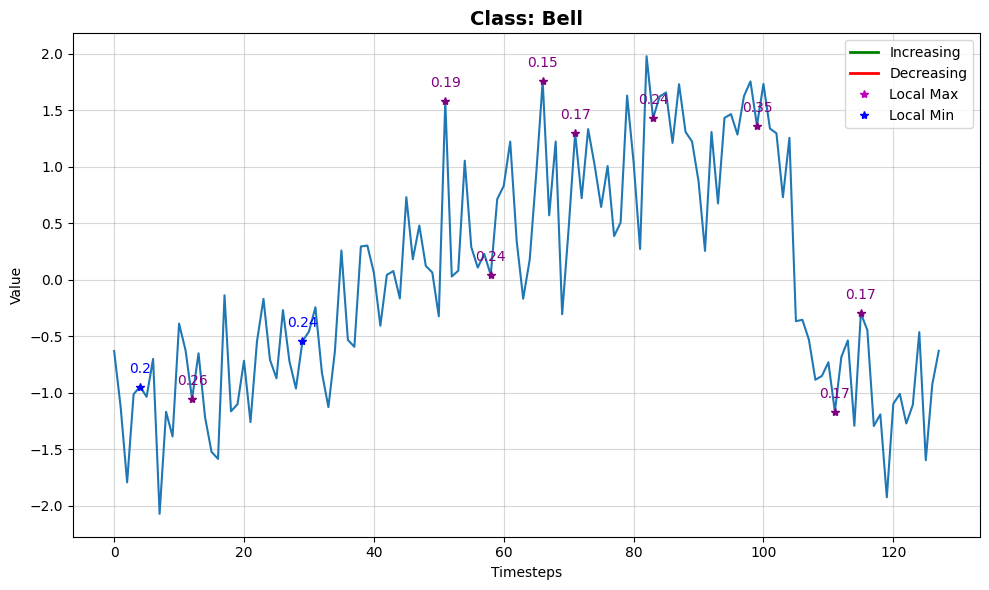

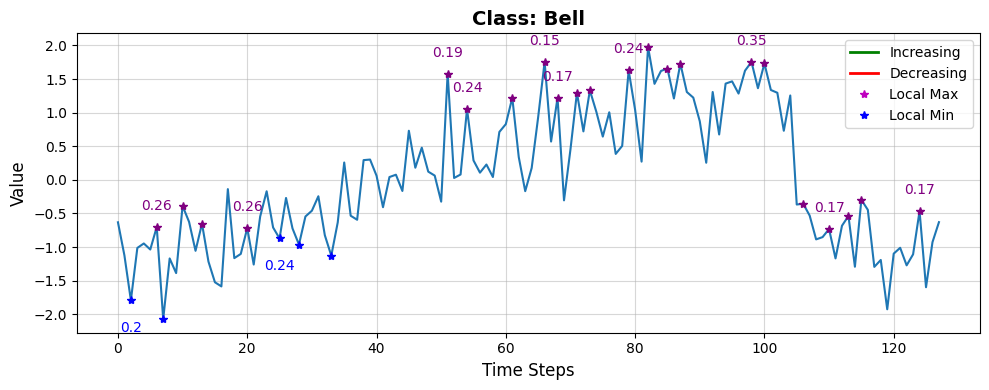

Prediction probability : tensor([4.5076e-03, 9.9464e-01, 8.5302e-04])
Cylinder:                      0.0045
Bell:                      0.9946
Funnel:                      0.0009
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15856 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13637 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35244 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35430 samples)
Optimal number of clusters for LocalMin_ch1: 19


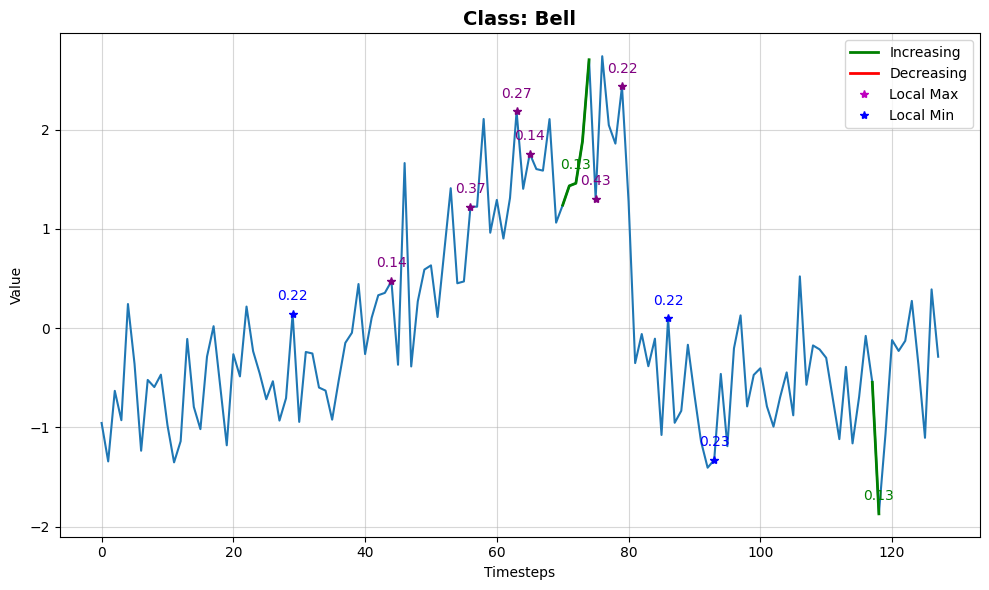

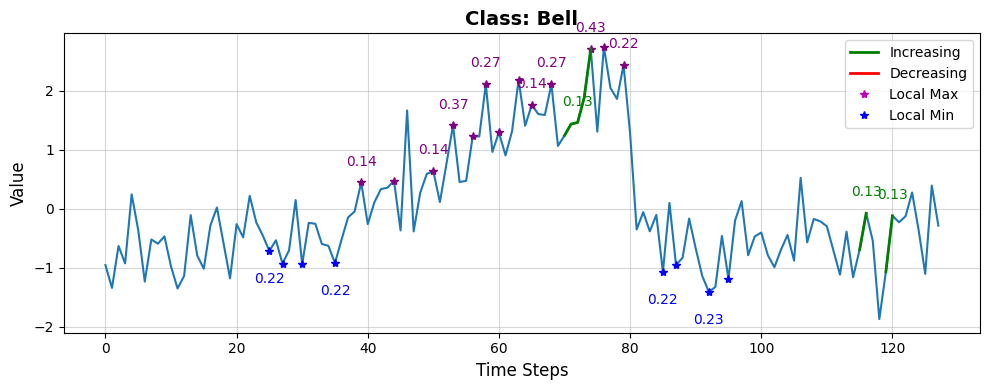

Prediction probability : tensor([1.9319e-04, 9.9909e-01, 7.1704e-04])
Cylinder:                      0.0002
Bell:                      0.9991
Funnel:                      0.0007
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14380 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12399 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37731 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38827 samples)
Optimal number of clusters for LocalMin_ch1: 3


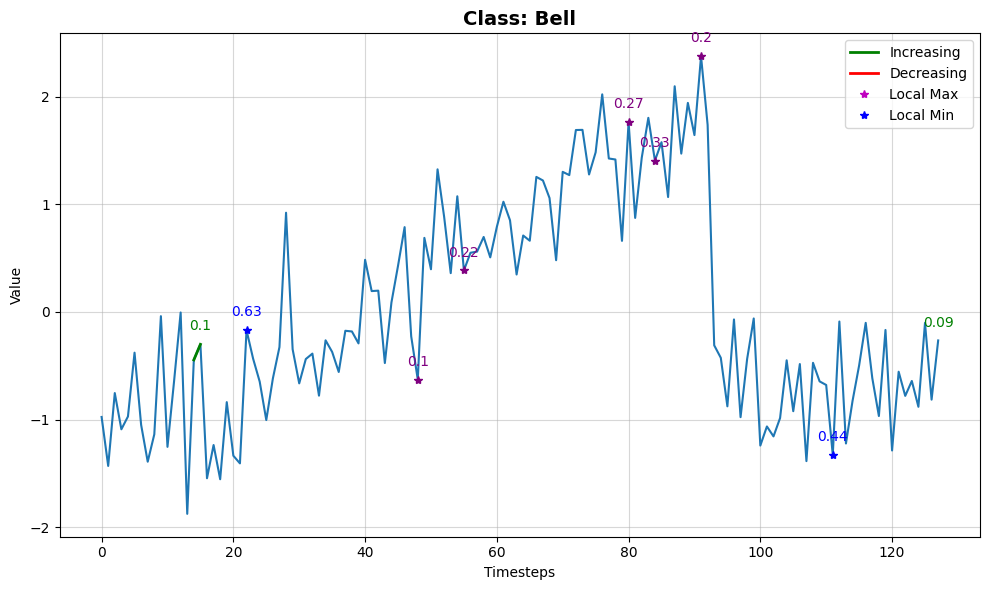

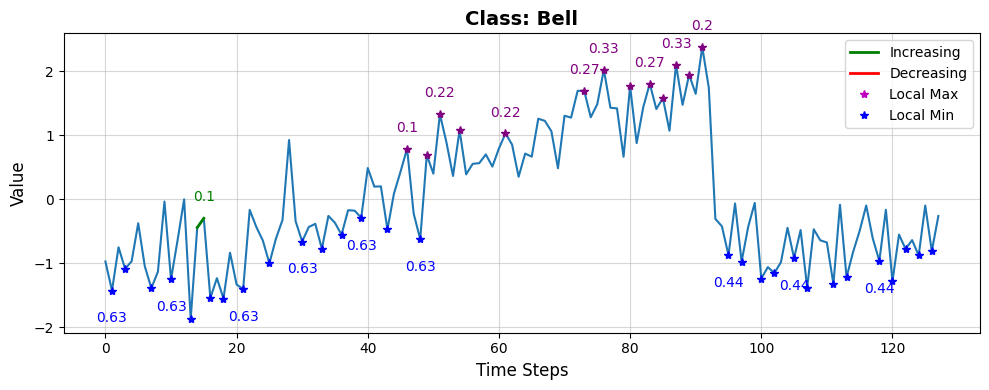

Prediction probability : tensor([4.0975e-03, 9.9581e-01, 8.8288e-05])
Cylinder:                      0.0041
Bell:                      0.9958
Funnel:                      0.0001
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10869 samples)
Optimal number of clusters for Increasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12743 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38758 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39892 samples)
Optimal number of clusters for LocalMin_ch1: 19


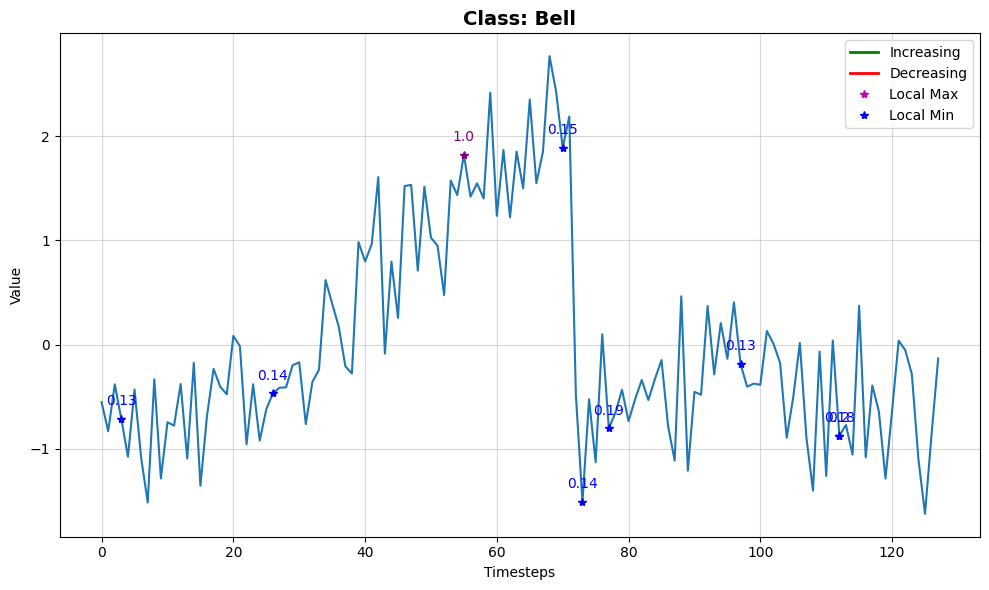

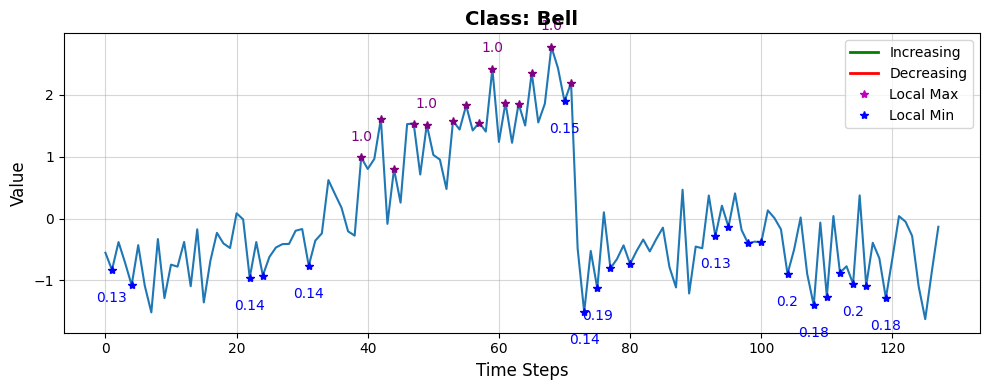

Prediction probability : tensor([0.0011, 0.9972, 0.0018])
Cylinder:                      0.0011
Bell:                      0.9972
Funnel:                      0.0018
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14146 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13522 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36612 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36739 samples)
Optimal number of clusters for LocalMin_ch1: 17


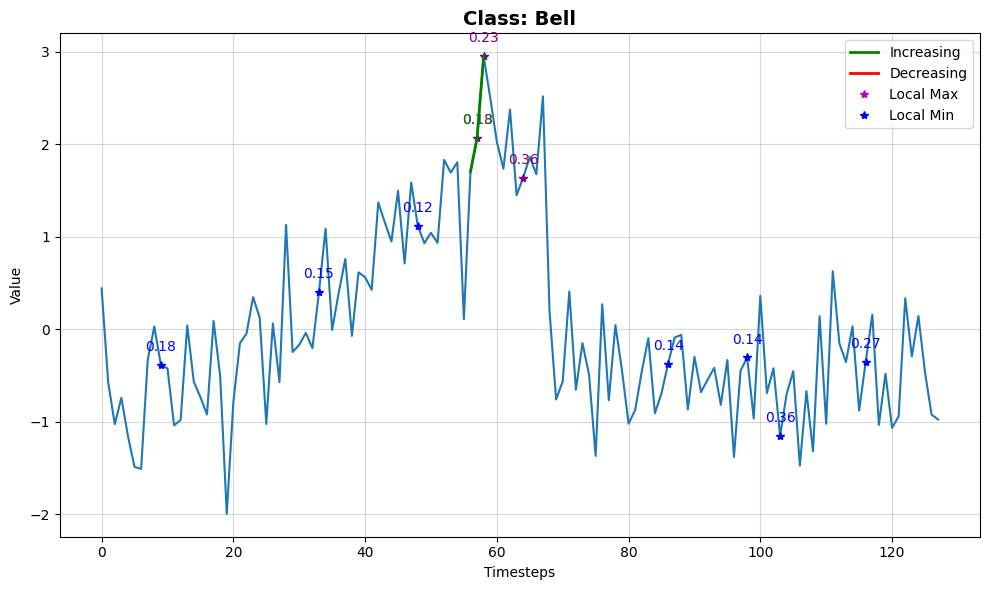

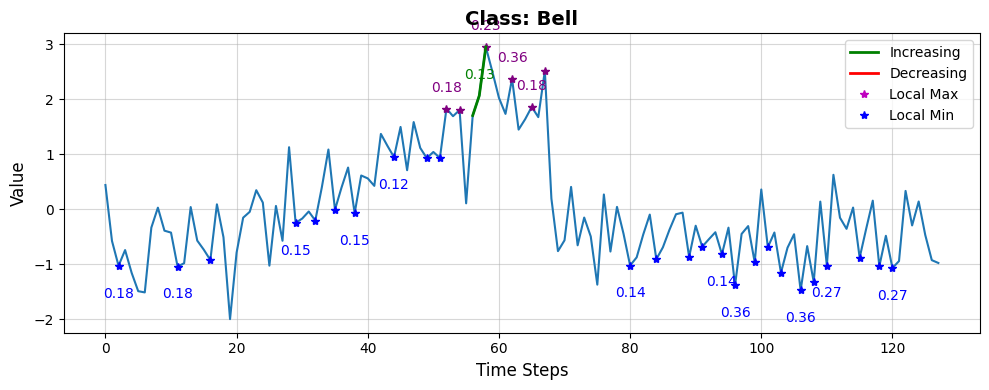

Prediction probability : tensor([1.2715e-04, 9.8009e-01, 1.9786e-02])
Cylinder:                      0.0001
Bell:                      0.9801
Funnel:                      0.0198
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16160 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14956 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37083 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38093 samples)
Optimal number of clusters for LocalMin_ch1: 3


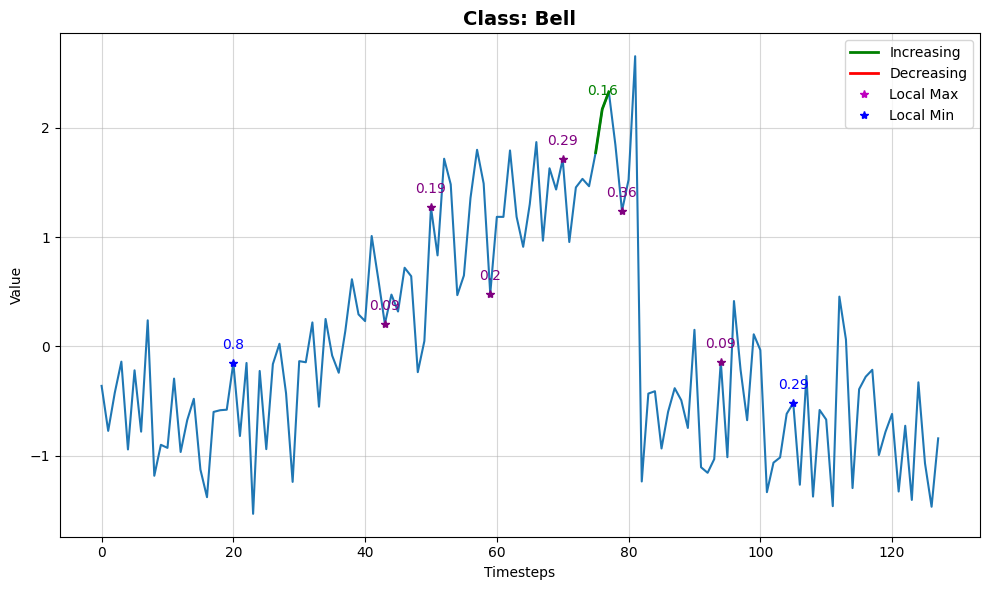

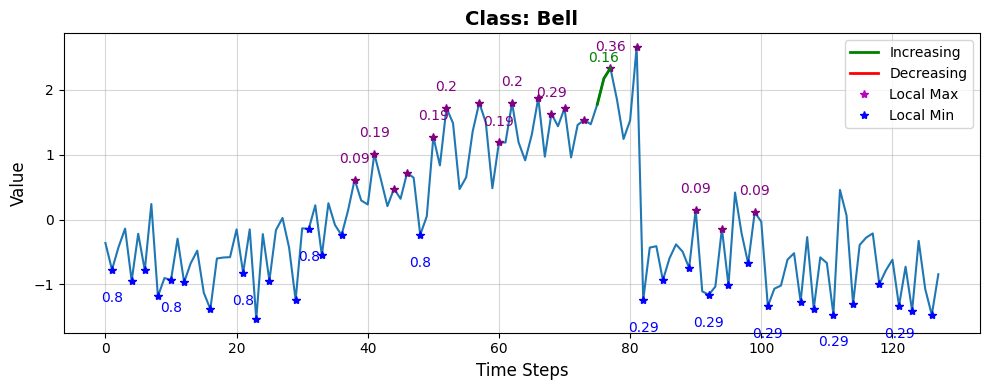

Prediction probability : tensor([6.5751e-04, 9.9711e-01, 2.2312e-03])
Cylinder:                      0.0007
Bell:                      0.9971
Funnel:                      0.0022
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14909 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15432 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36274 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36455 samples)
Optimal number of clusters for LocalMin_ch1: 19


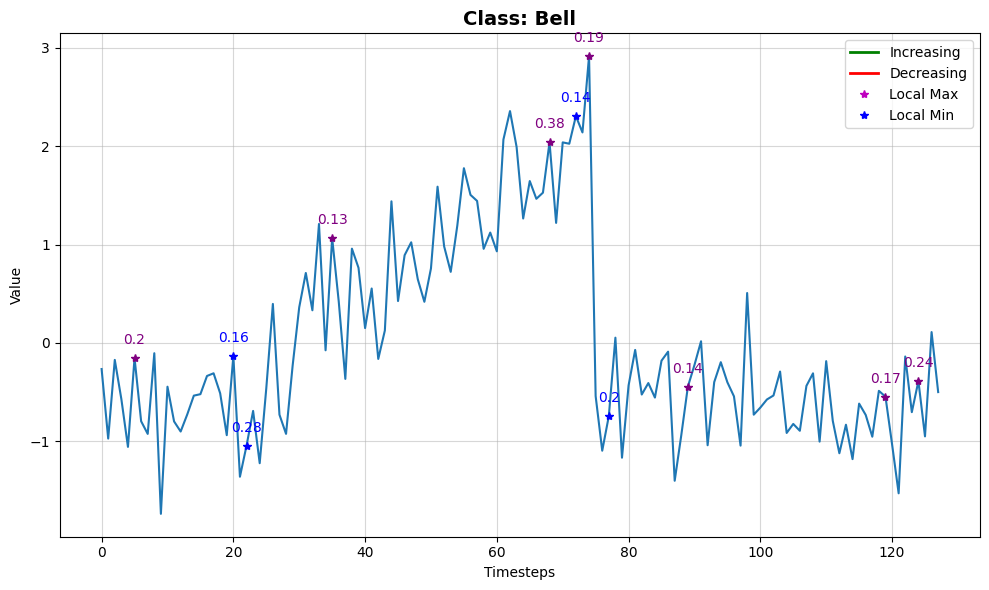

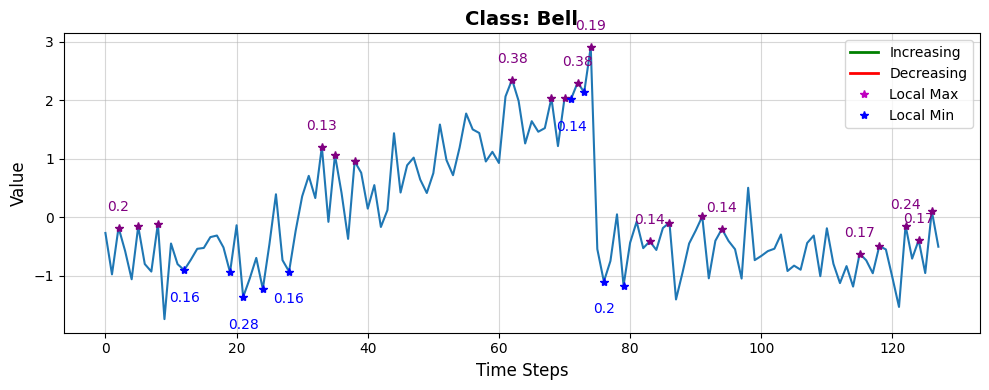

Prediction probability : tensor([0.0034, 0.9913, 0.0053])
Cylinder:                      0.0034
Bell:                      0.9913
Funnel:                      0.0053
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15535 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15957 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37127 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37239 samples)
Optimal number of clusters for LocalMin_ch1: 3


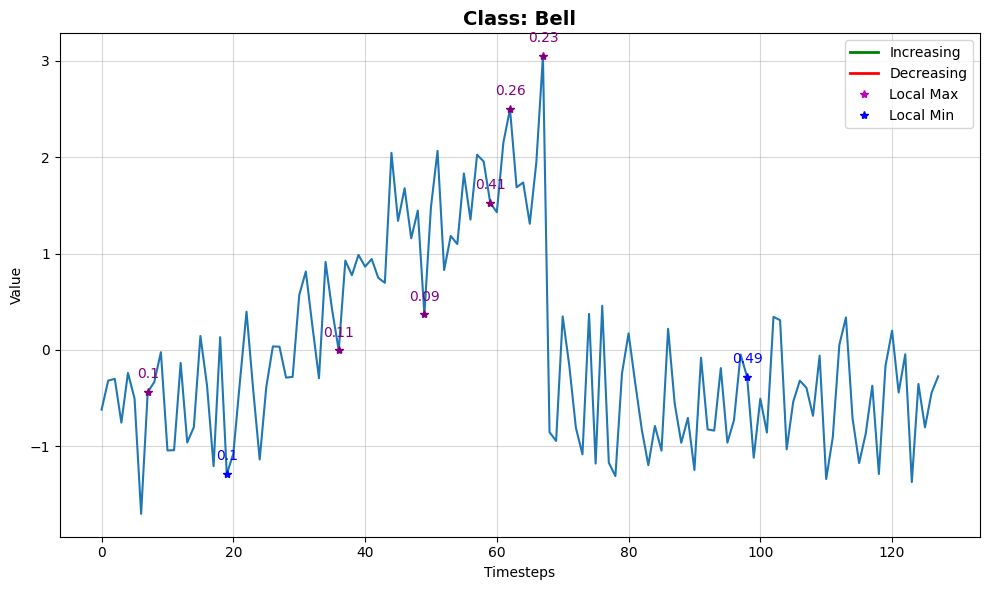

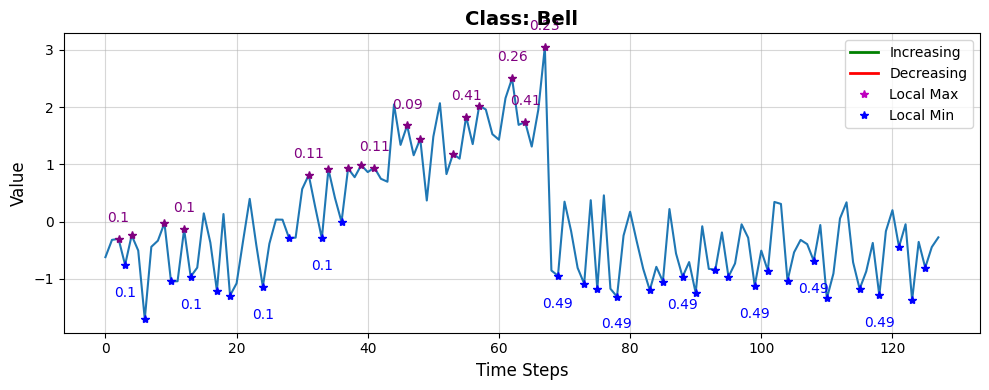

Prediction probability : tensor([4.3946e-05, 9.9233e-01, 7.6237e-03])
Cylinder:                      0.0000
Bell:                      0.9923
Funnel:                      0.0076
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16703 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17666 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34404 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34501 samples)
Optimal number of clusters for LocalMin_ch1: 19


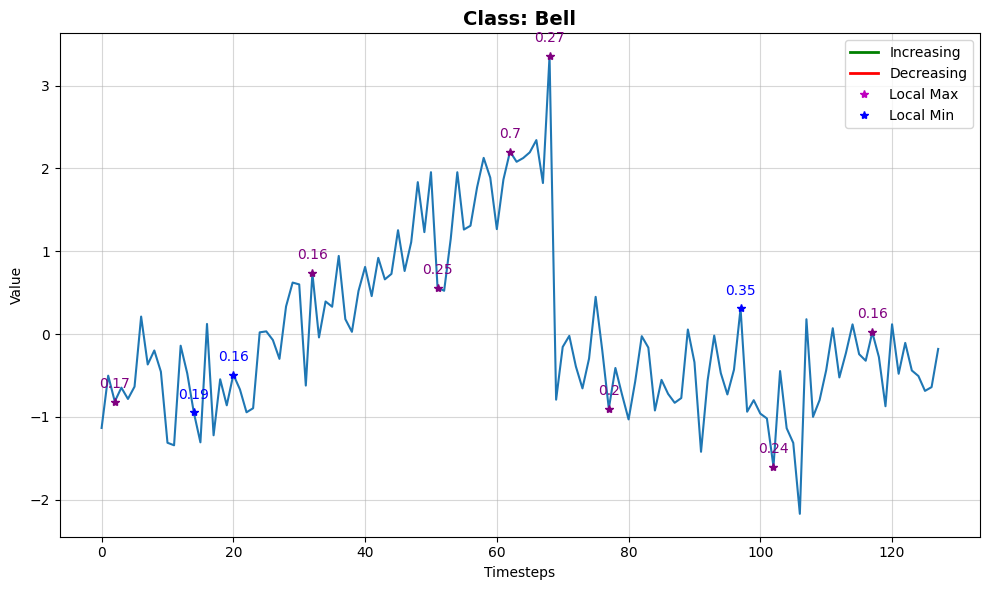

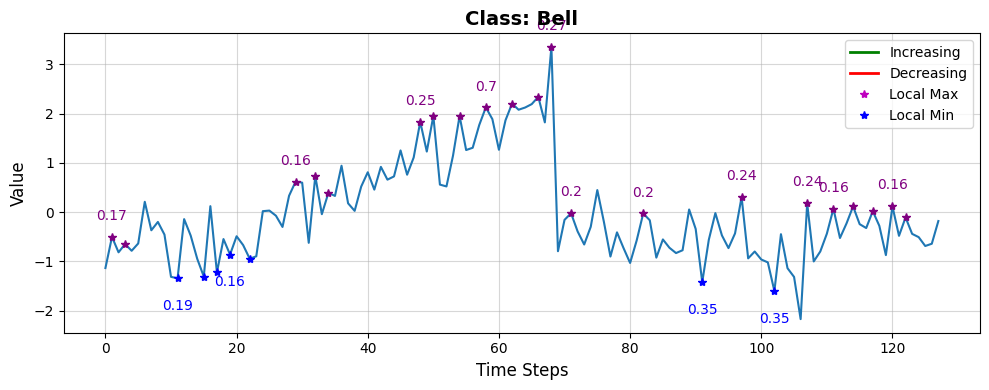

Prediction probability : tensor([0.0013, 0.9974, 0.0012])
Cylinder:                      0.0013
Bell:                      0.9974
Funnel:                      0.0012
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10798 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14324 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38716 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37823 samples)
Optimal number of clusters for LocalMin_ch1: 18


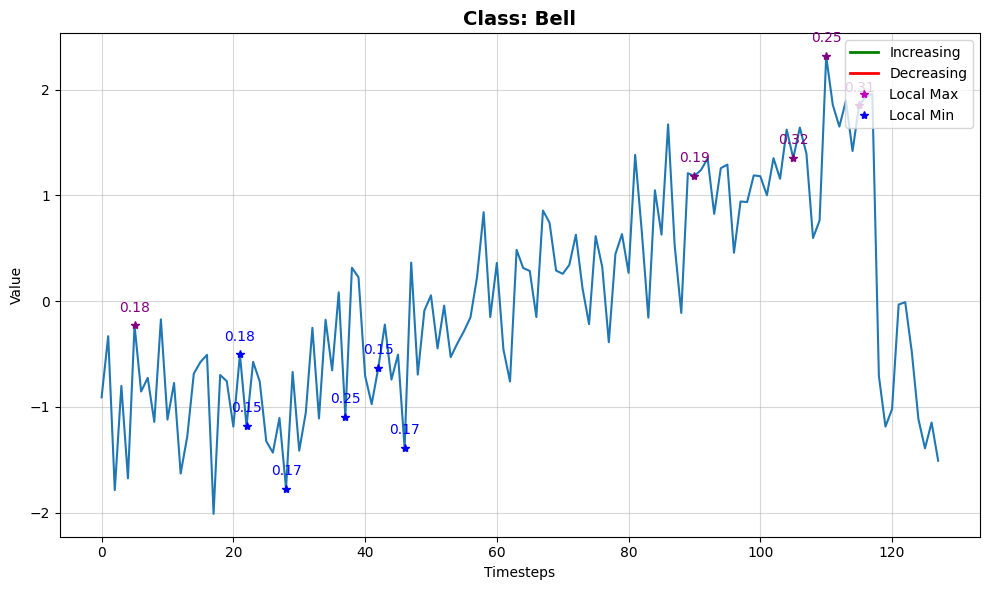

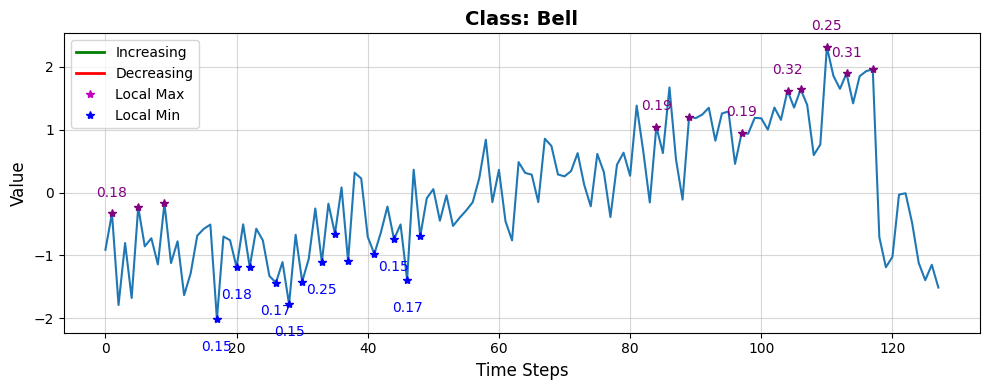

Prediction probability : tensor([4.6336e-04, 9.9939e-01, 1.4439e-04])
Cylinder:                      0.0005
Bell:                      0.9994
Funnel:                      0.0001
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15400 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16941 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35254 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35274 samples)
Optimal number of clusters for LocalMin_ch1: 17


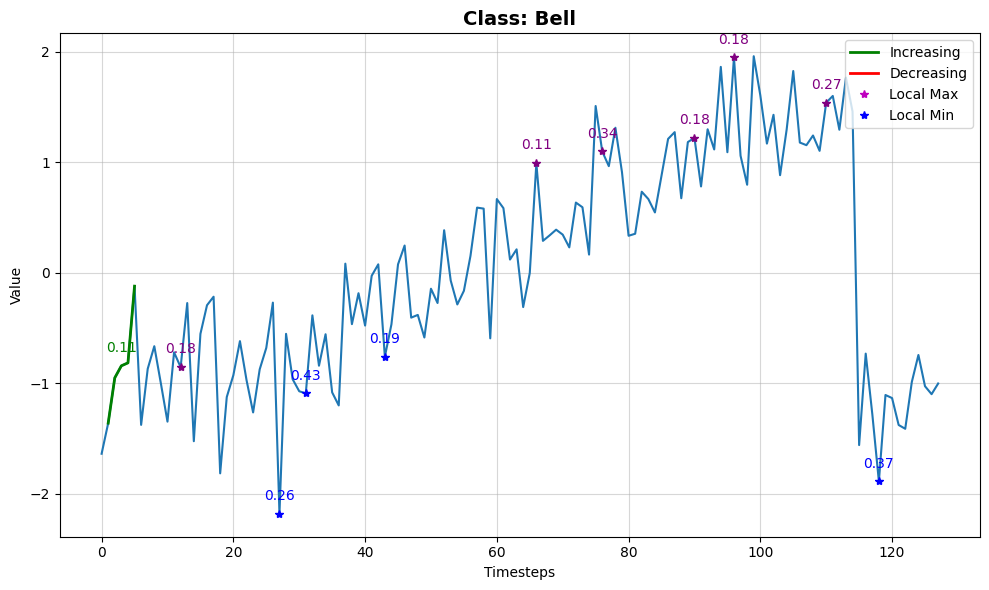

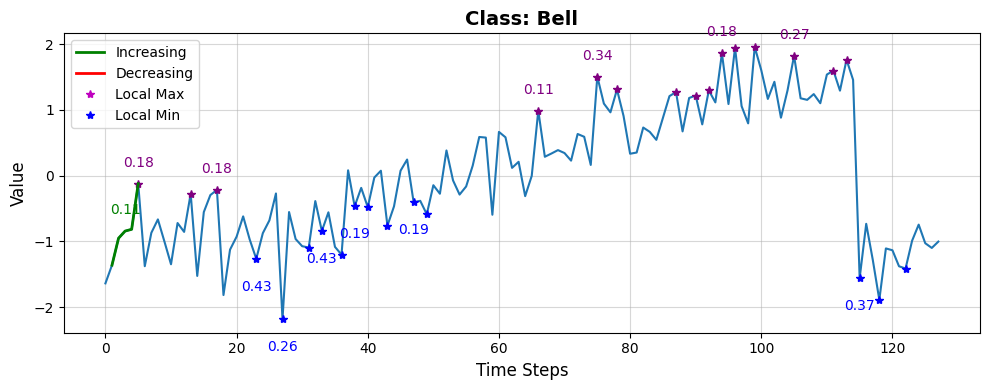

Prediction probability : tensor([1.1243e-02, 9.8873e-01, 2.7423e-05])
Cylinder:                      0.0112
Bell:                      0.9887
Funnel:                      0.0000
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16820 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15261 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33439 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33528 samples)
Optimal number of clusters for LocalMin_ch1: 19


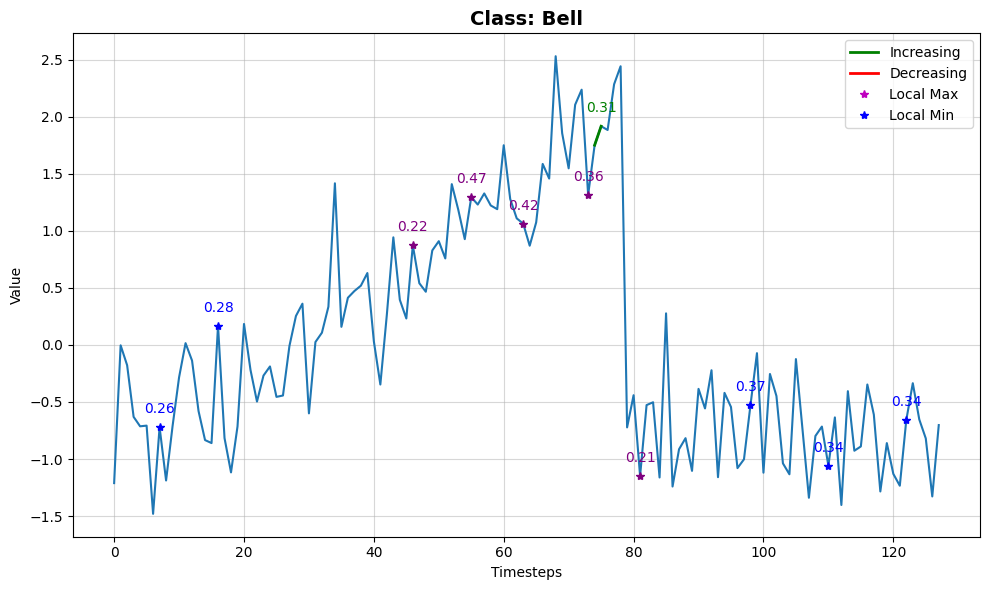

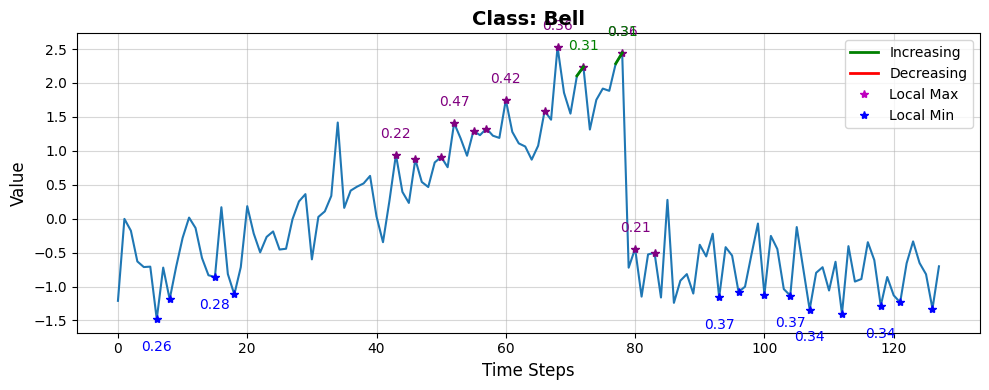

Prediction probability : tensor([5.6615e-02, 9.4285e-01, 5.3897e-04])
Cylinder:                      0.0566
Bell:                      0.9428
Funnel:                      0.0005
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16833 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10099 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37895 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39063 samples)
Optimal number of clusters for LocalMin_ch1: 18


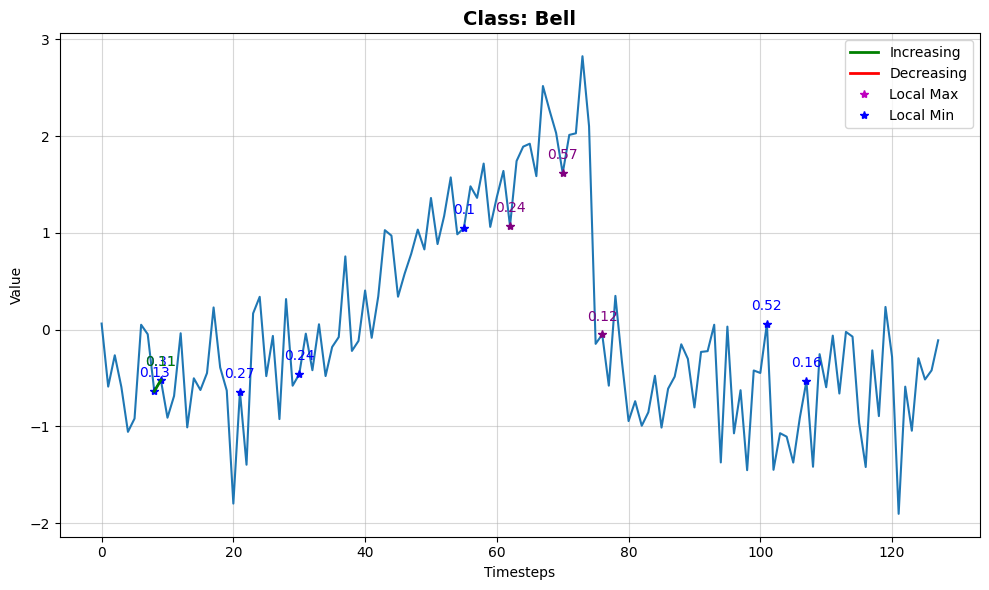

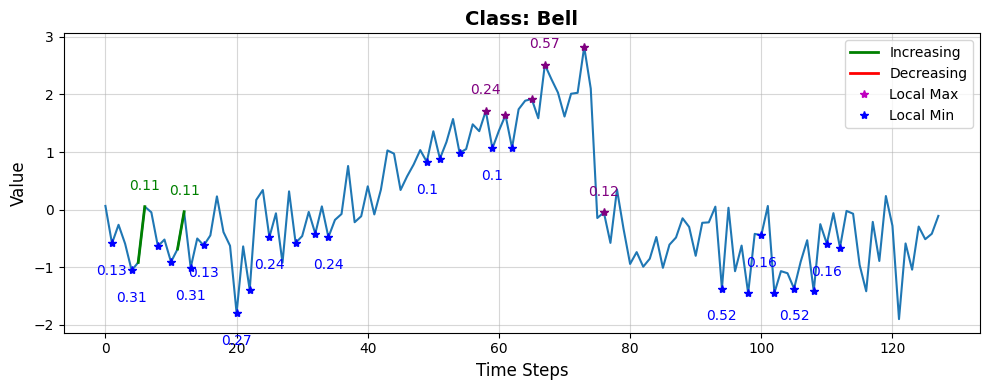

Prediction probability : tensor([1.2707e-03, 9.9830e-01, 4.2592e-04])
Cylinder:                      0.0013
Bell:                      0.9983
Funnel:                      0.0004
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18750 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14291 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36463 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36485 samples)
Optimal number of clusters for LocalMin_ch1: 19


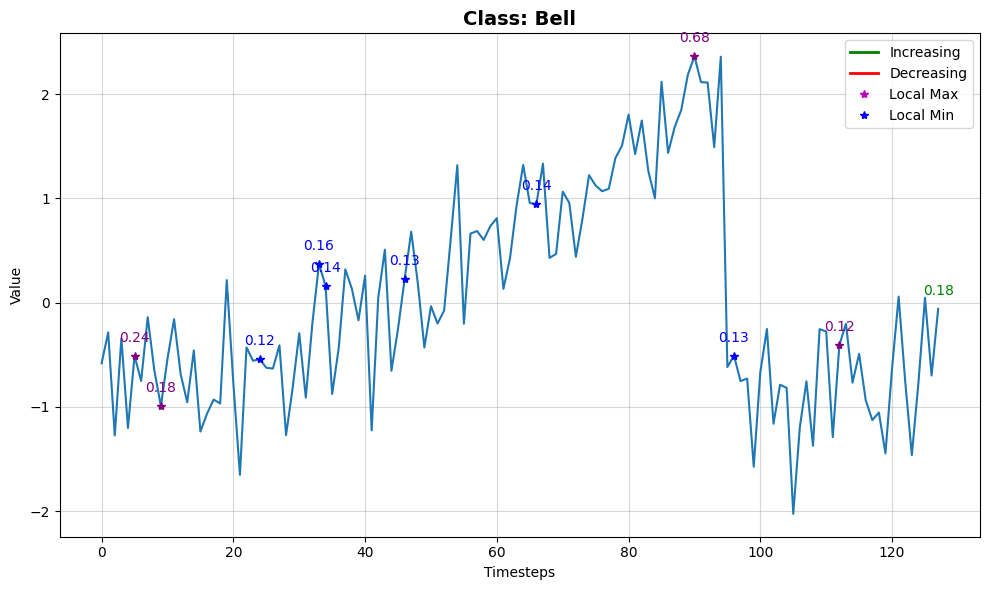

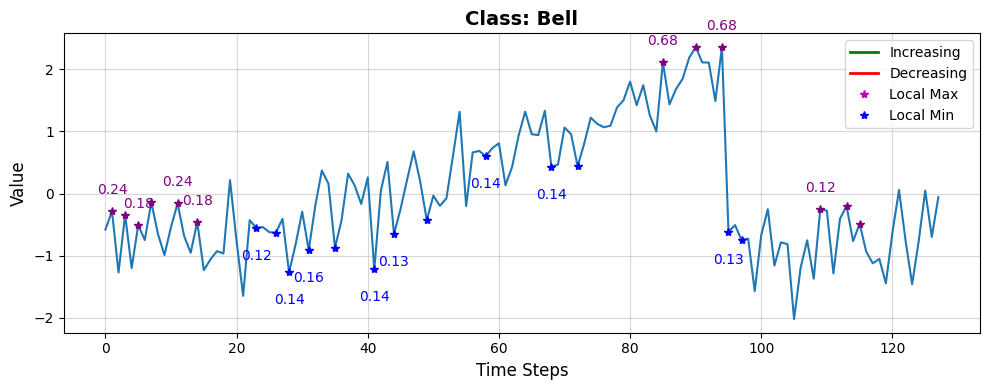

Prediction probability : tensor([4.9846e-04, 9.9942e-01, 8.3937e-05])
Cylinder:                      0.0005
Bell:                      0.9994
Funnel:                      0.0001

📈 Global Faithfulness (Avg Local Fidelity): 0.8271

=== Running SP-LOMATCE for class Funnel ===
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16105 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14248 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37987 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37921 samples)
Optimal number of clusters for LocalMin_ch1: 19


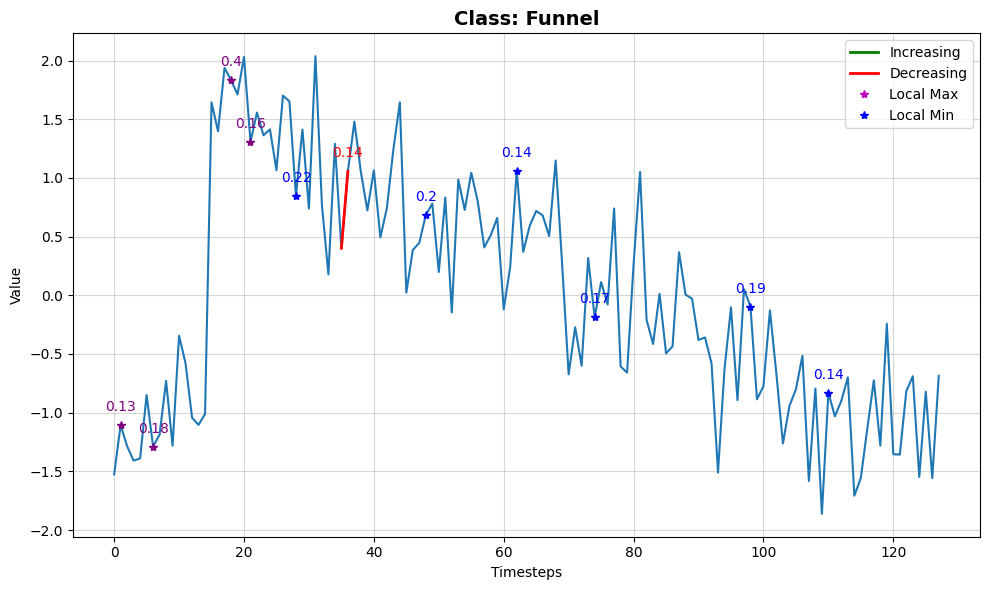

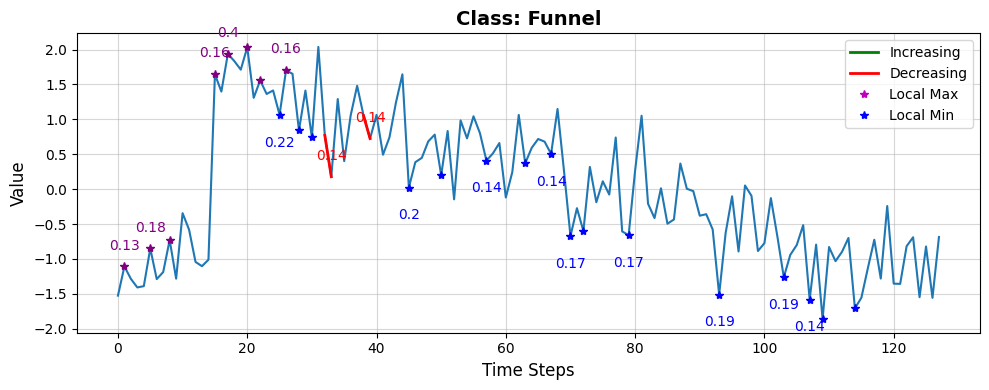

Prediction probability : tensor([1.1730e-03, 1.3408e-04, 9.9869e-01])
Cylinder:                      0.0012
Bell:                      0.0001
Funnel:                      0.9987
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15168 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17019 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35211 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35364 samples)
Optimal number of clusters for LocalMin_ch1: 19


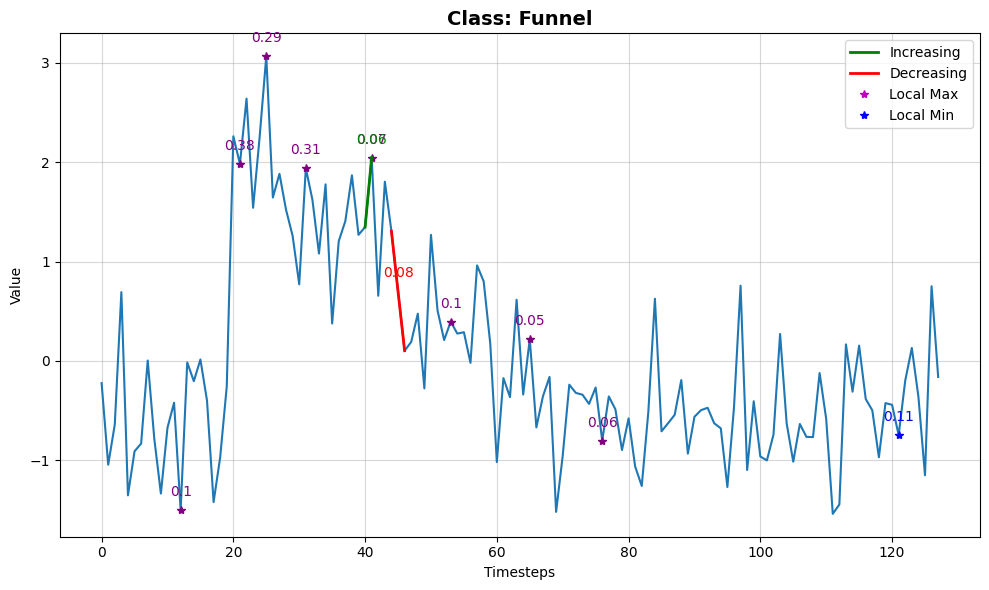

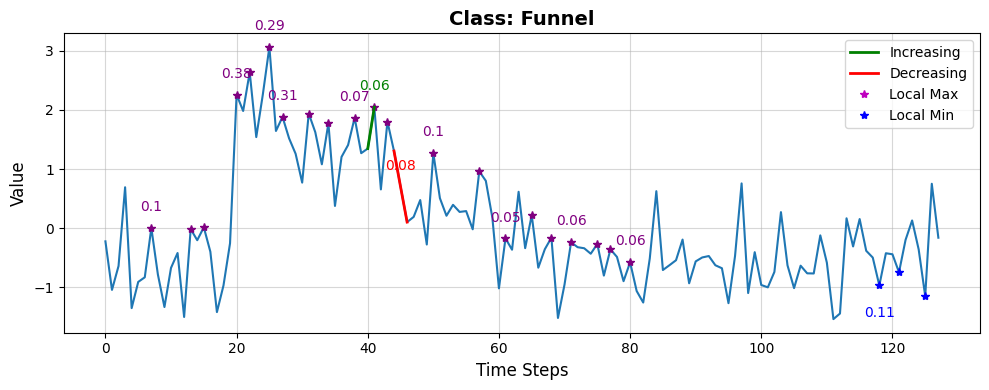

Prediction probability : tensor([9.9579e-06, 7.2312e-04, 9.9927e-01])
Cylinder:                      0.0000
Bell:                      0.0007
Funnel:                      0.9993
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15099 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15085 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35106 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33949 samples)
Optimal number of clusters for LocalMin_ch1: 18


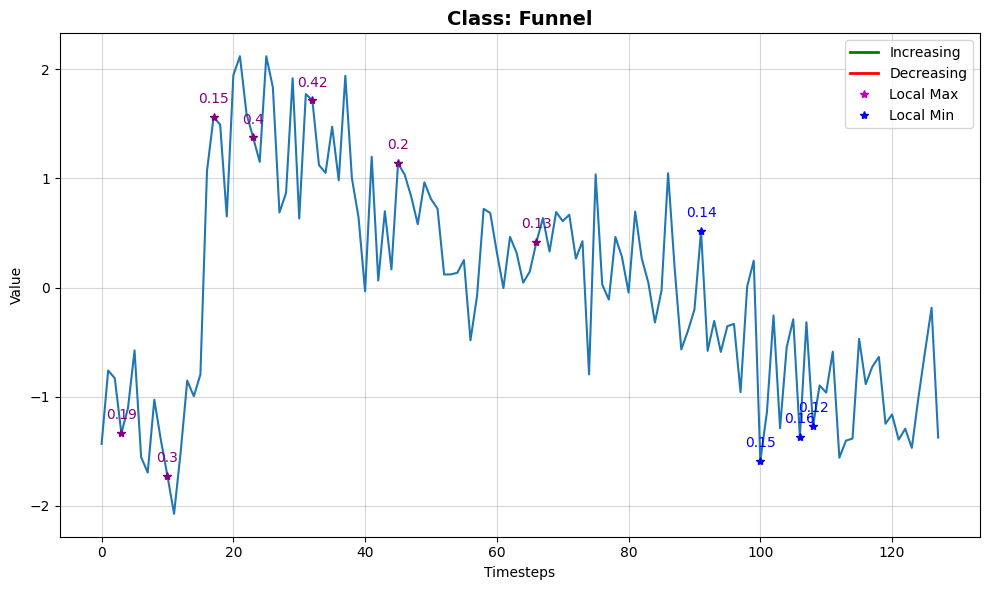

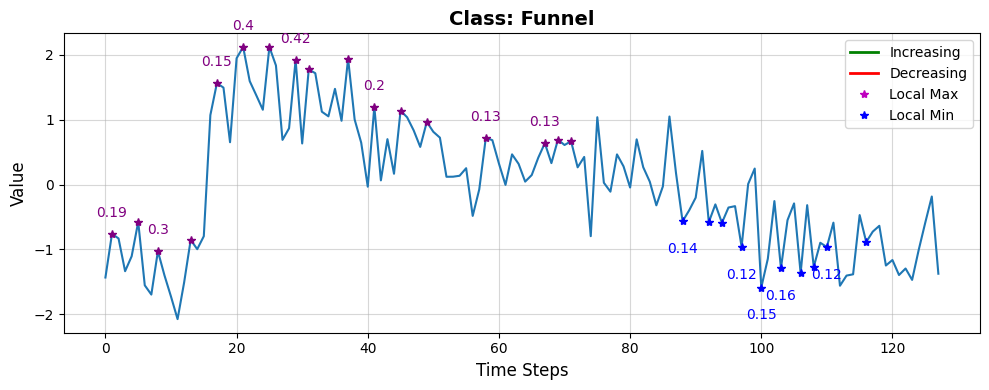

Prediction probability : tensor([2.3306e-03, 1.3808e-04, 9.9753e-01])
Cylinder:                      0.0023
Bell:                      0.0001
Funnel:                      0.9975
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13761 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14163 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37193 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38216 samples)
Optimal number of clusters for LocalMin_ch1: 18


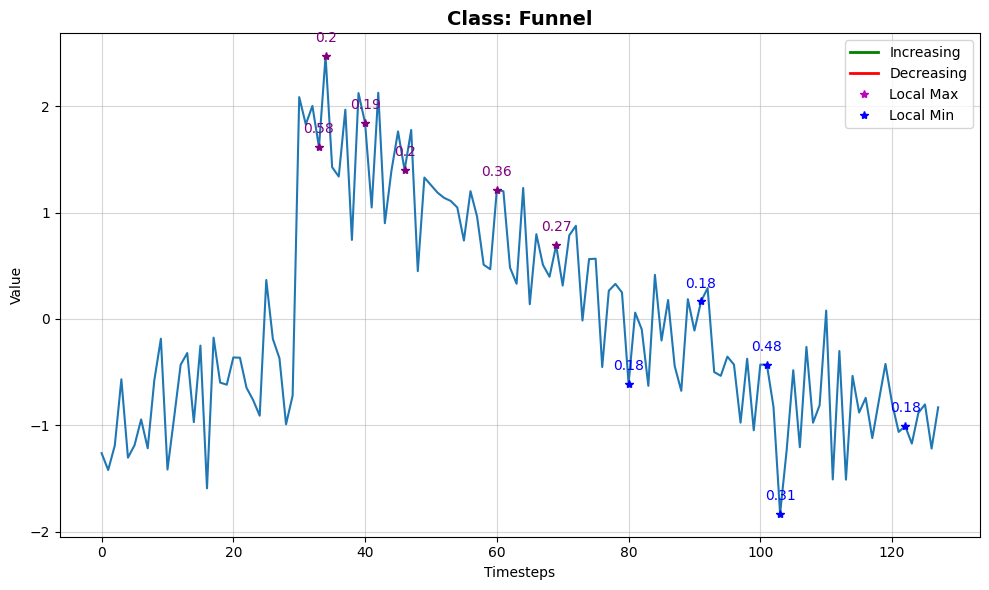

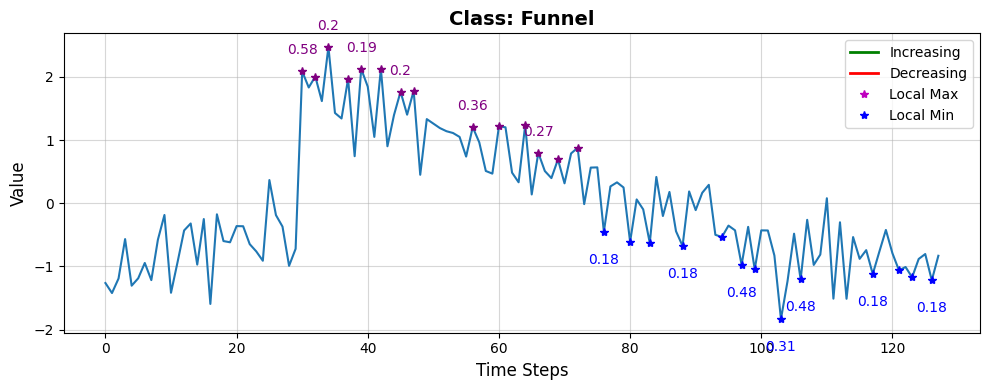

Prediction probability : tensor([1.8878e-02, 3.8767e-04, 9.8073e-01])
Cylinder:                      0.0189
Bell:                      0.0004
Funnel:                      0.9807
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16006 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14313 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37887 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37030 samples)
Optimal number of clusters for LocalMin_ch1: 3


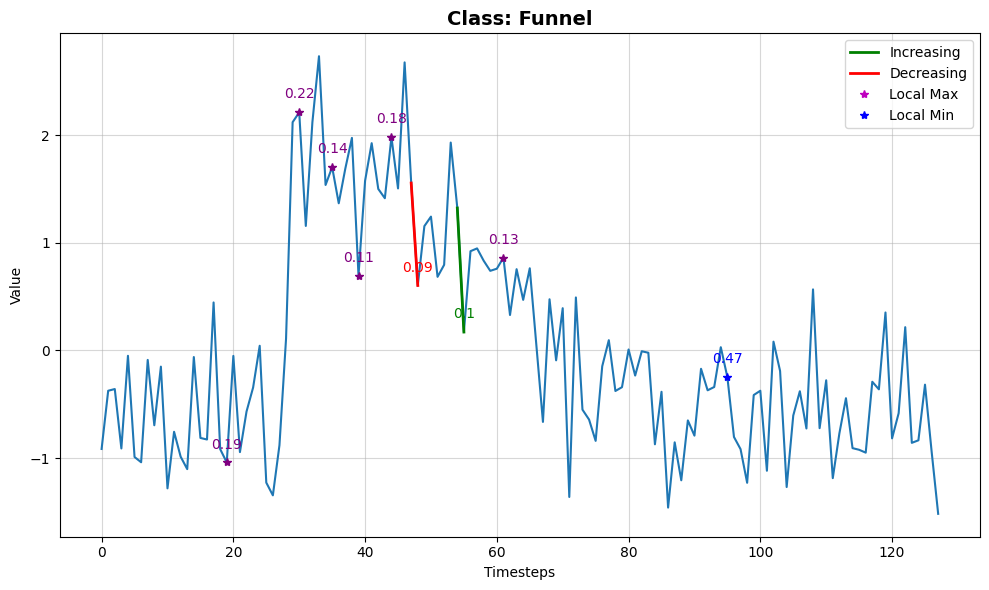

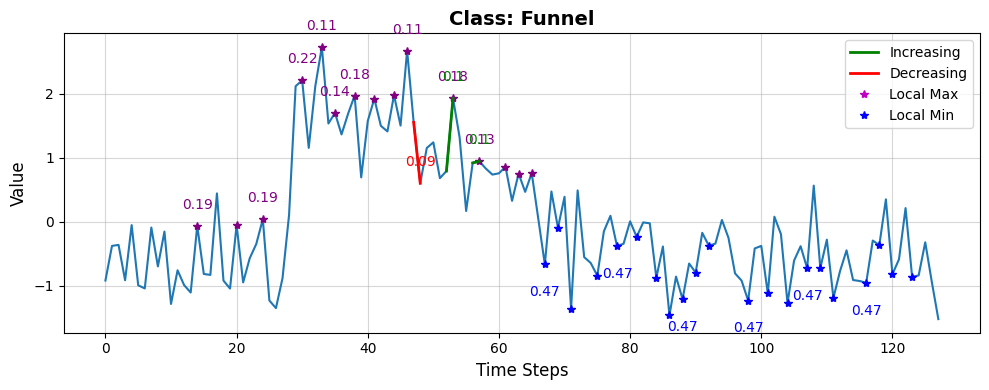

Prediction probability : tensor([2.3697e-04, 1.4150e-03, 9.9835e-01])
Cylinder:                      0.0002
Bell:                      0.0014
Funnel:                      0.9983
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13403 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19522 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36342 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37248 samples)
Optimal number of clusters for LocalMin_ch1: 19


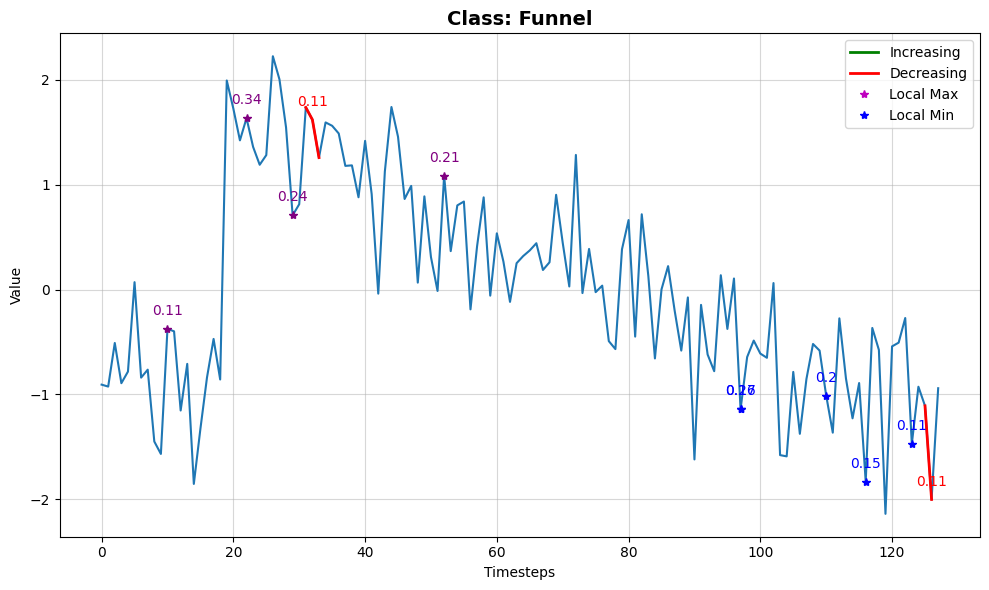

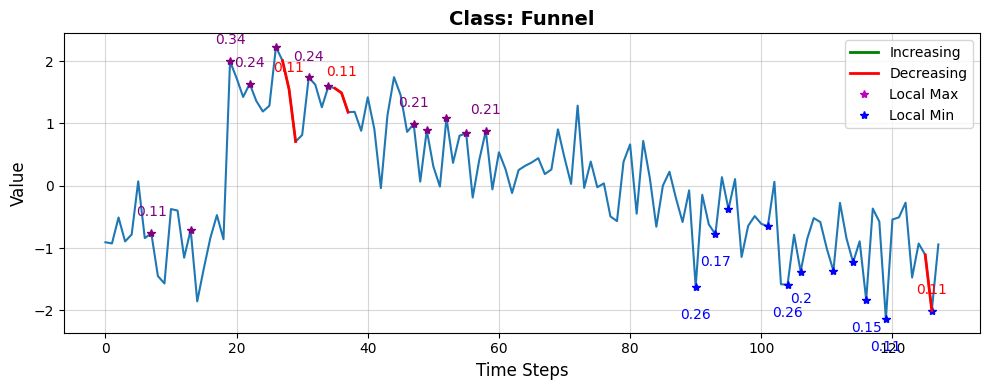

Prediction probability : tensor([1.1961e-04, 6.1387e-05, 9.9982e-01])
Cylinder:                      0.0001
Bell:                      0.0001
Funnel:                      0.9998
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14469 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14270 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34569 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34746 samples)
Optimal number of clusters for LocalMin_ch1: 18


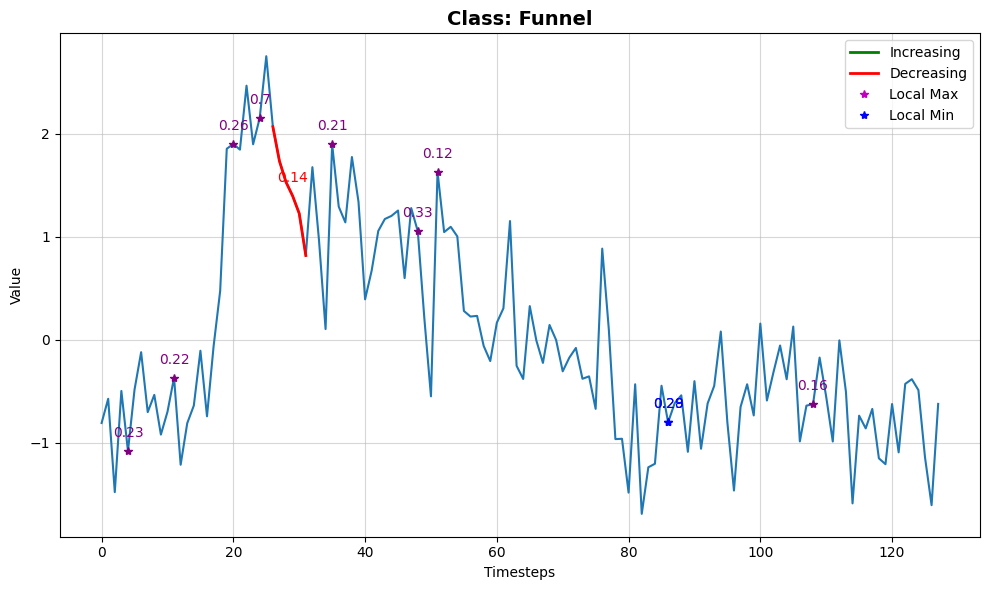

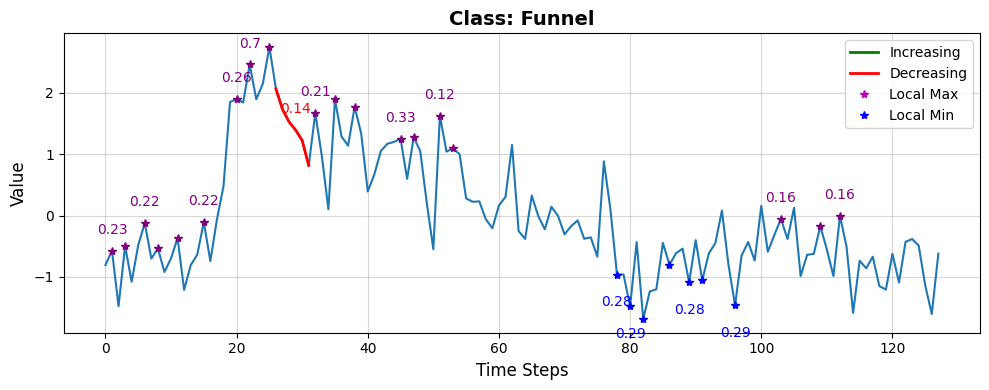

Prediction probability : tensor([7.0933e-04, 4.9361e-04, 9.9880e-01])
Cylinder:                      0.0007
Bell:                      0.0005
Funnel:                      0.9988
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16139 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14949 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37717 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37890 samples)
Optimal number of clusters for LocalMin_ch1: 18


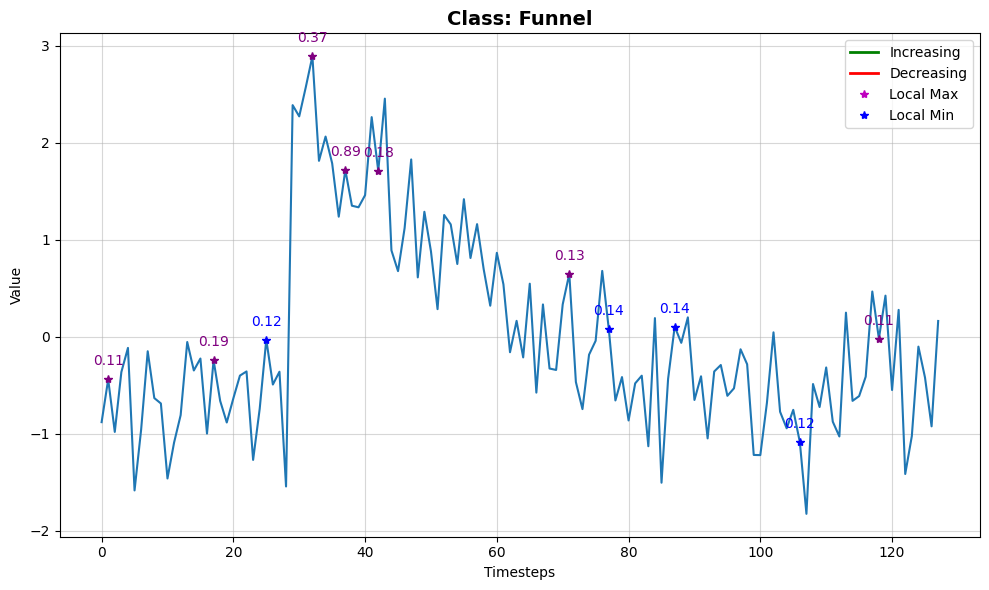

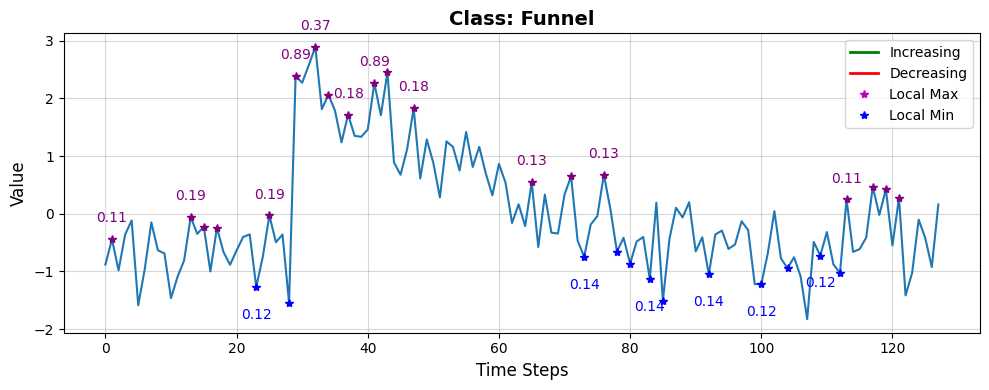

Prediction probability : tensor([1.2582e-04, 9.3140e-04, 9.9894e-01])
Cylinder:                      0.0001
Bell:                      0.0009
Funnel:                      0.9989
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15096 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10057 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 41381 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 41476 samples)
Optimal number of clusters for LocalMin_ch1: 18


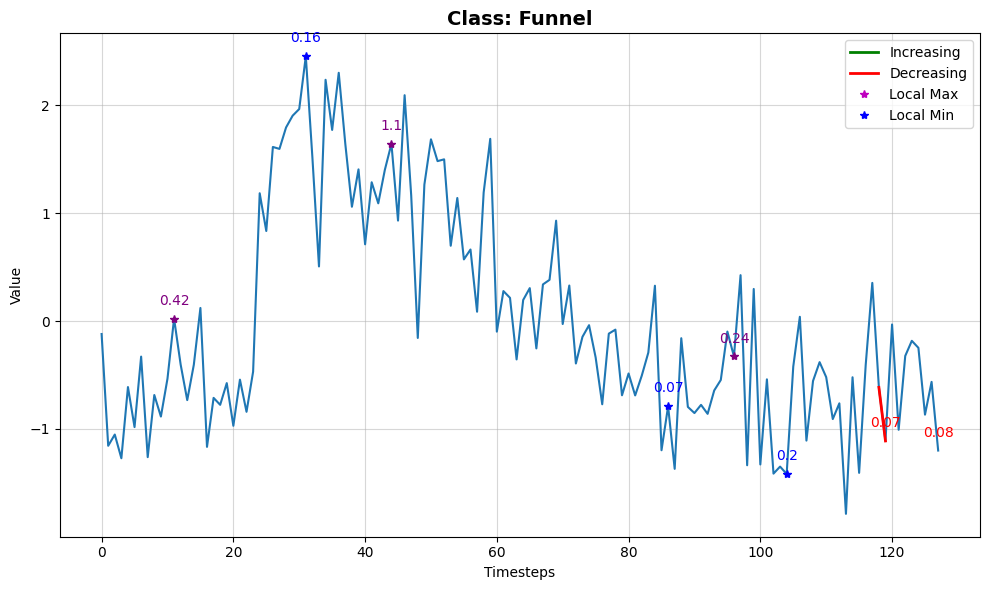

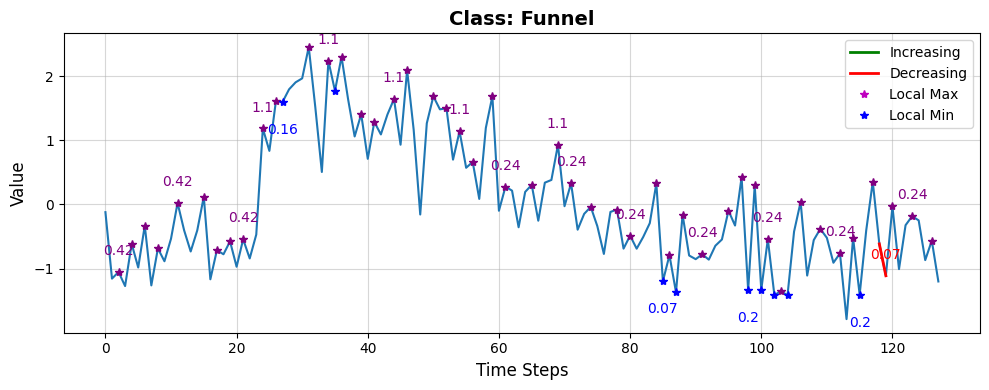

Prediction probability : tensor([2.7027e-04, 1.9581e-03, 9.9777e-01])
Cylinder:                      0.0003
Bell:                      0.0020
Funnel:                      0.9978
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16994 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12594 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35156 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36305 samples)
Optimal number of clusters for LocalMin_ch1: 19


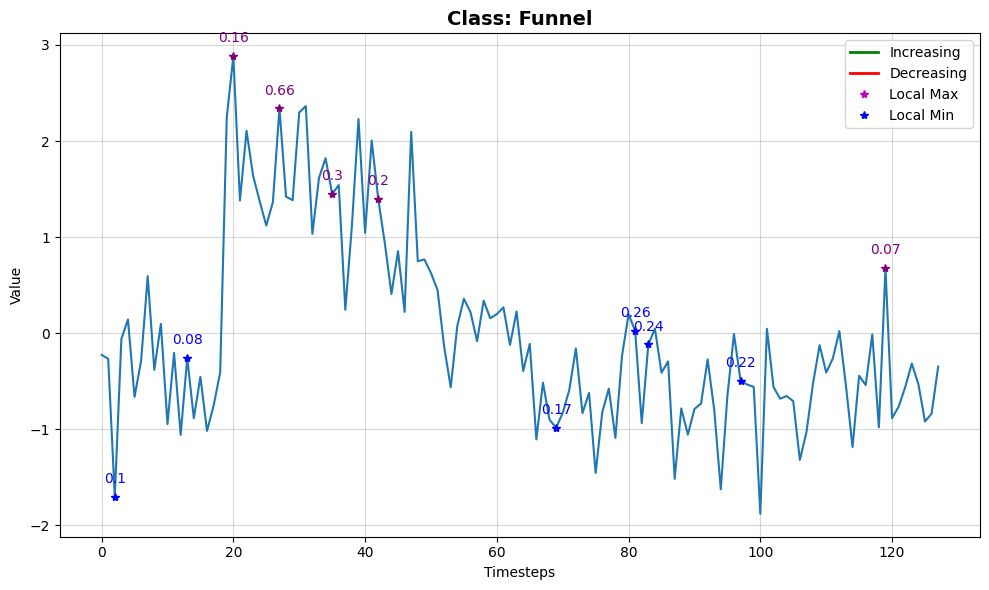

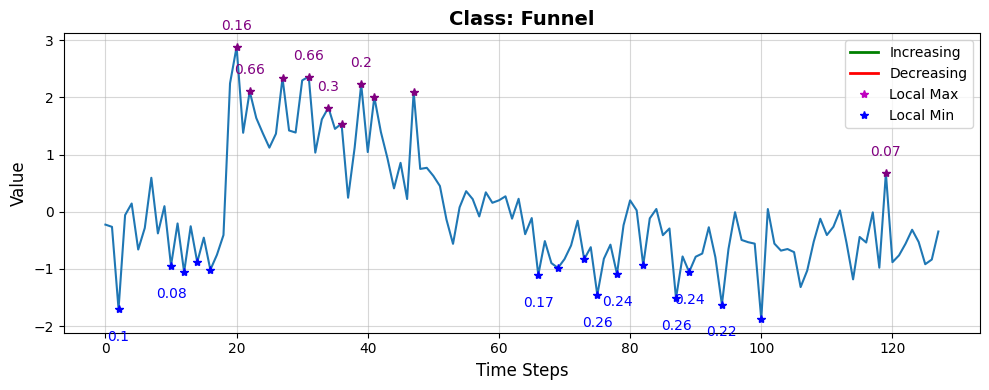

Prediction probability : tensor([3.9698e-05, 6.2090e-04, 9.9934e-01])
Cylinder:                      0.0000
Bell:                      0.0006
Funnel:                      0.9993
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13516 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12611 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38776 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38938 samples)
Optimal number of clusters for LocalMin_ch1: 3


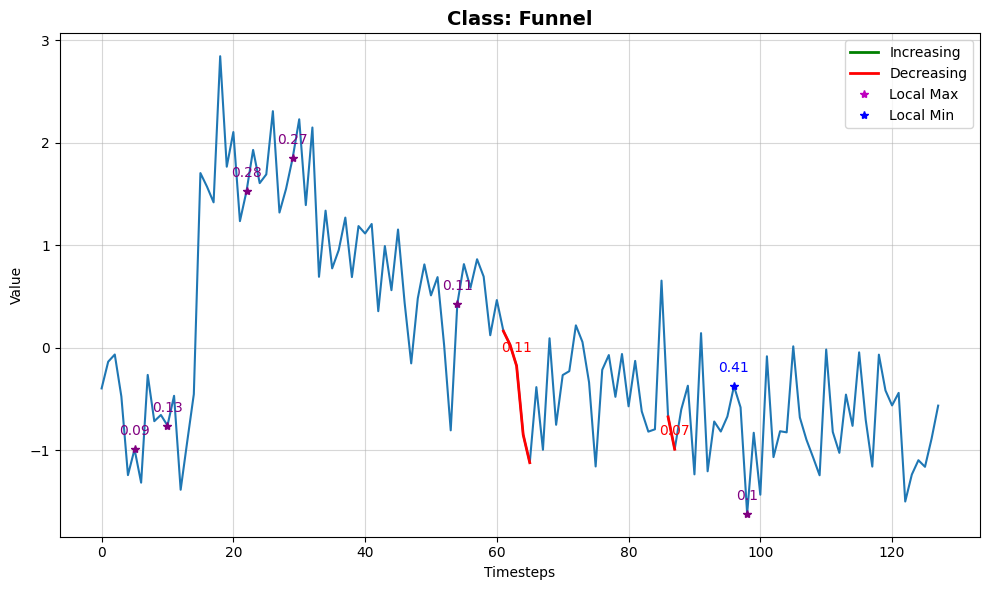

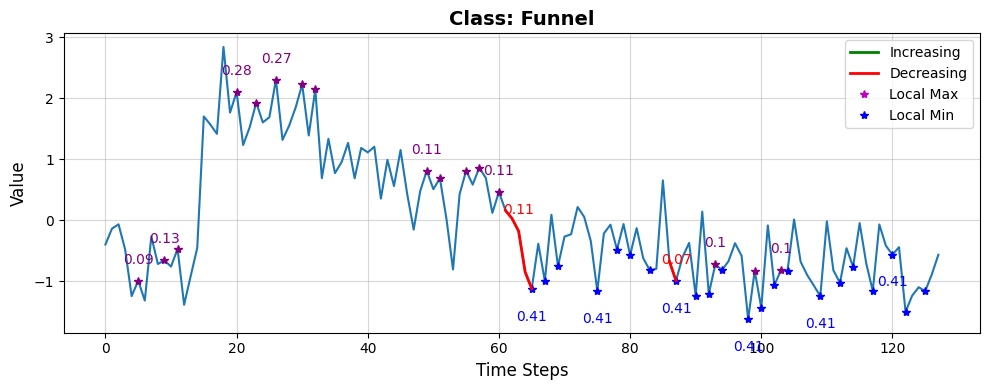

Prediction probability : tensor([2.2916e-04, 4.9364e-05, 9.9972e-01])
Cylinder:                      0.0002
Bell:                      0.0000
Funnel:                      0.9997
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 9072 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14218 samples)
Optimal number of clusters for Decreasing_ch1: 15
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38661 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39654 samples)
Optimal number of clusters for LocalMin_ch1: 3


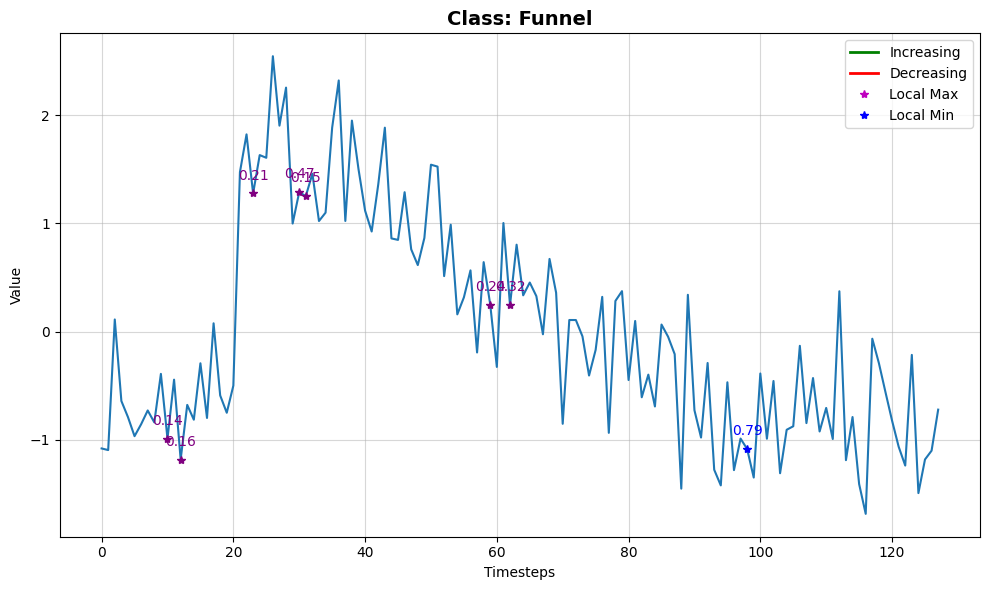

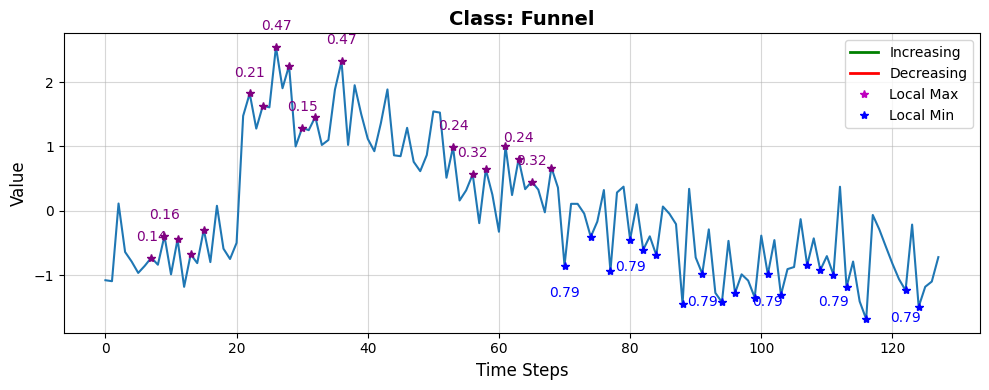

Prediction probability : tensor([1.0945e-03, 2.4173e-04, 9.9866e-01])
Cylinder:                      0.0011
Bell:                      0.0002
Funnel:                      0.9987
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11717 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15244 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39570 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38688 samples)
Optimal number of clusters for LocalMin_ch1: 19


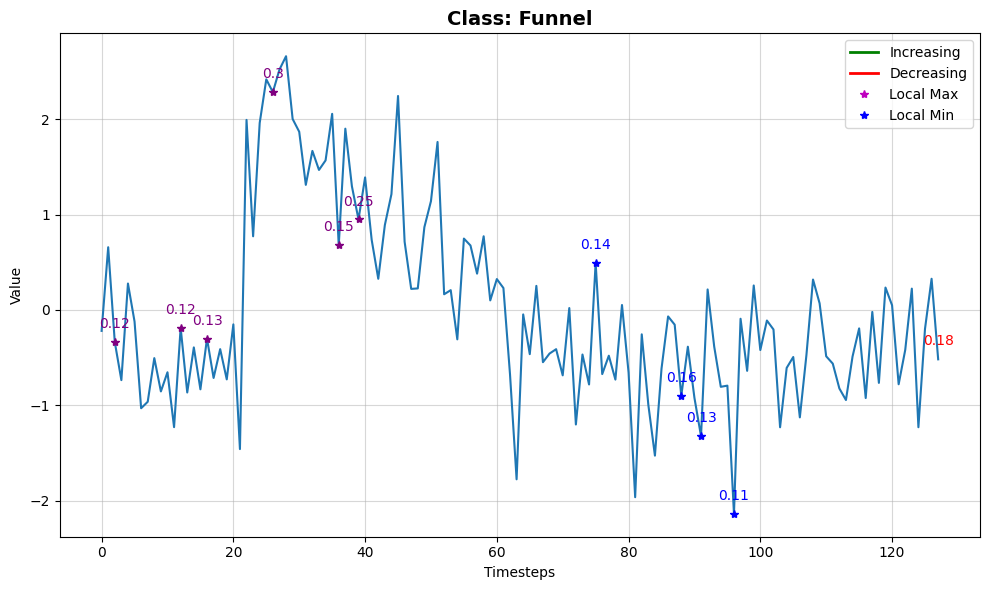

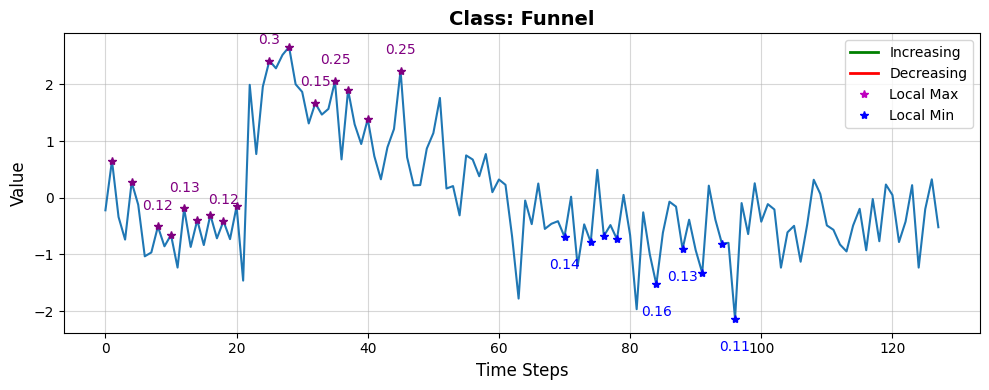

Prediction probability : tensor([3.8060e-06, 1.7981e-03, 9.9820e-01])
Cylinder:                      0.0000
Bell:                      0.0018
Funnel:                      0.9982
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12506 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10731 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40532 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40500 samples)
Optimal number of clusters for LocalMin_ch1: 3


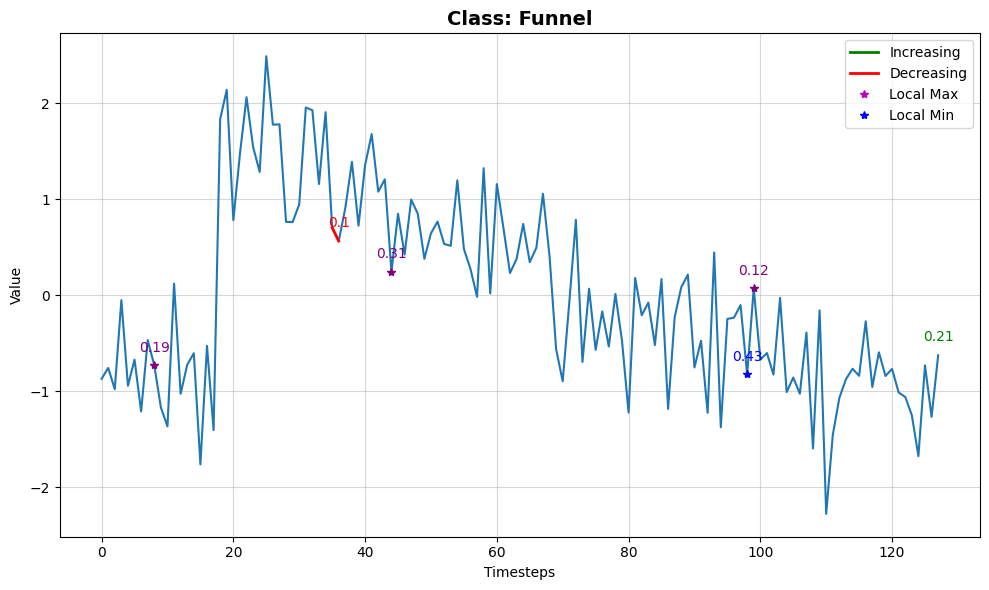

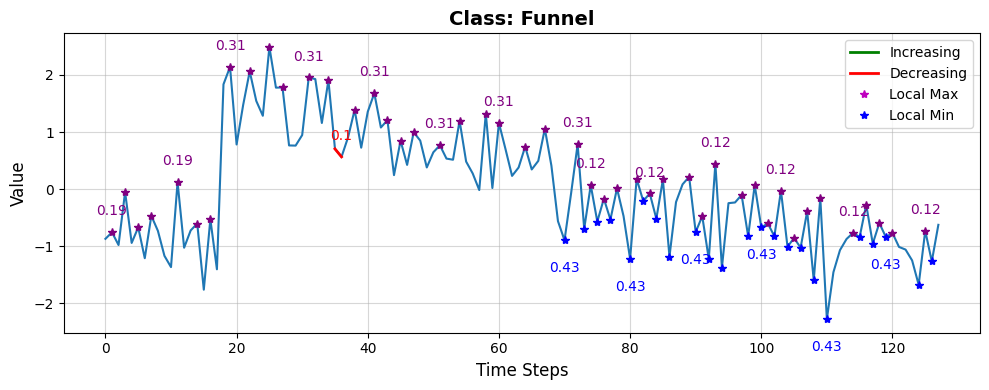

Prediction probability : tensor([9.7478e-05, 1.0809e-04, 9.9979e-01])
Cylinder:                      0.0001
Bell:                      0.0001
Funnel:                      0.9998
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15259 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14336 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37903 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37761 samples)
Optimal number of clusters for LocalMin_ch1: 19


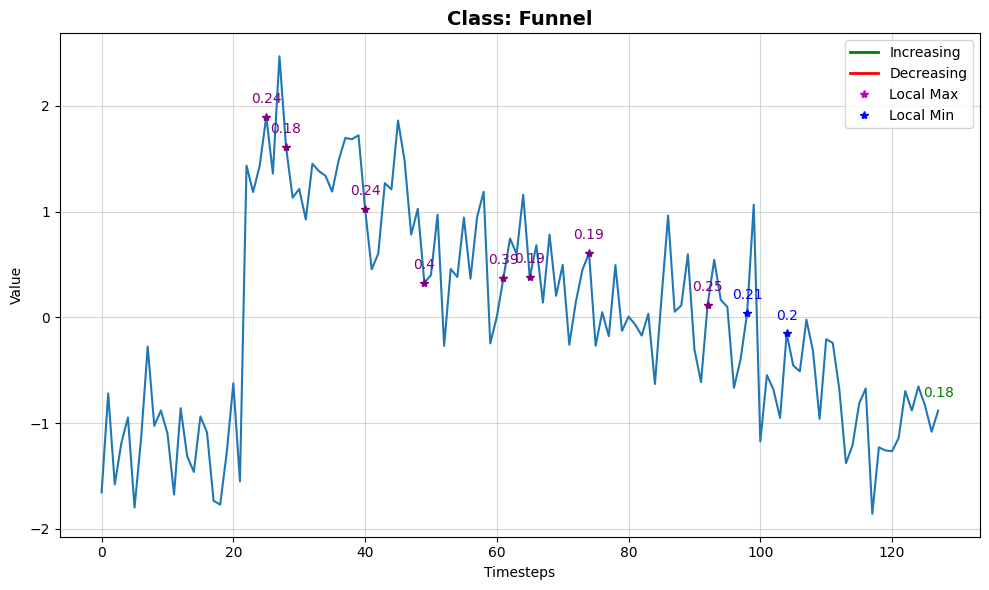

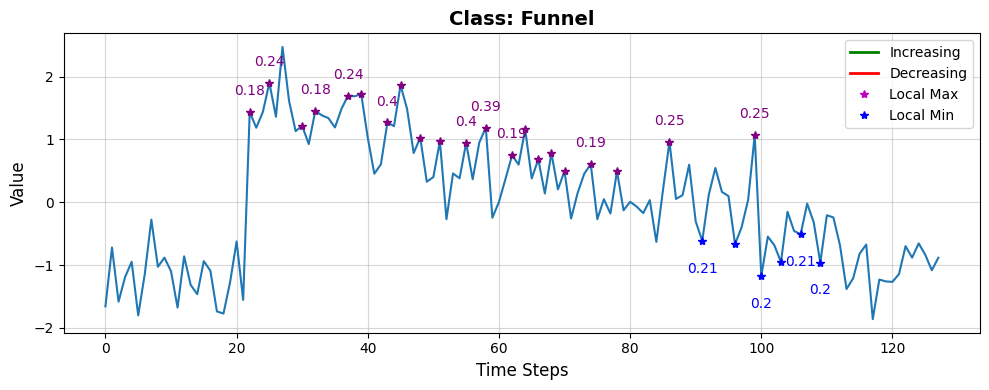

Prediction probability : tensor([9.2582e-03, 2.8945e-04, 9.9045e-01])
Cylinder:                      0.0093
Bell:                      0.0003
Funnel:                      0.9905

📈 Global Faithfulness (Avg Local Fidelity): 0.6948

=== 📊 Final Visualization for All Classes ===



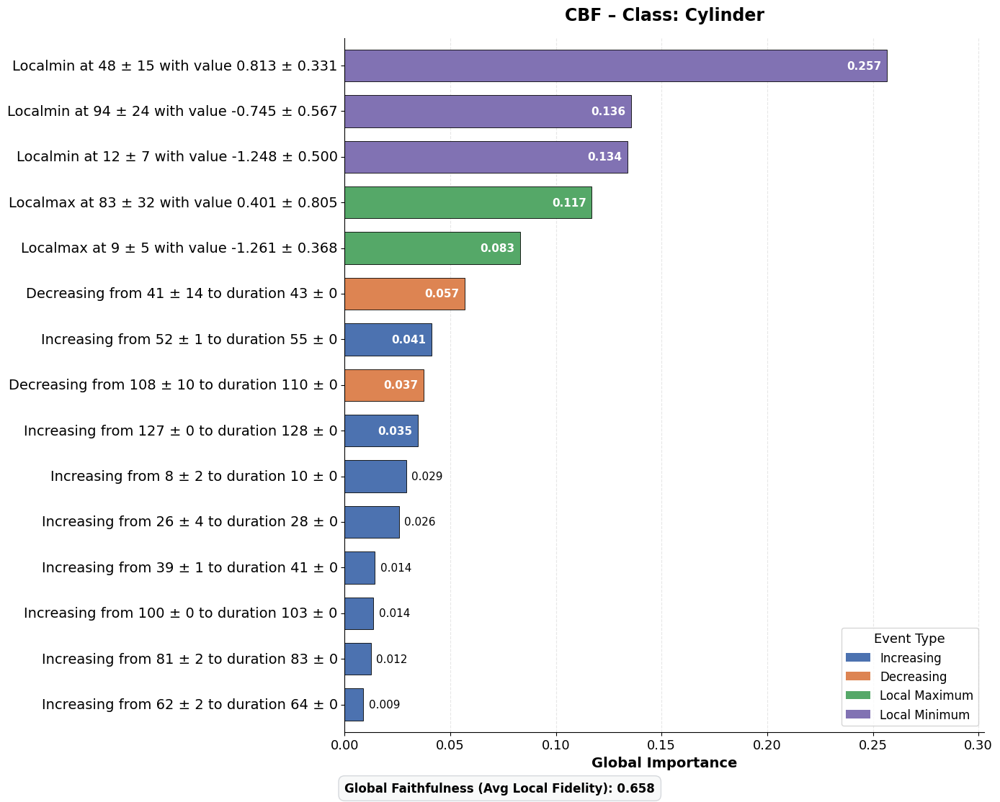

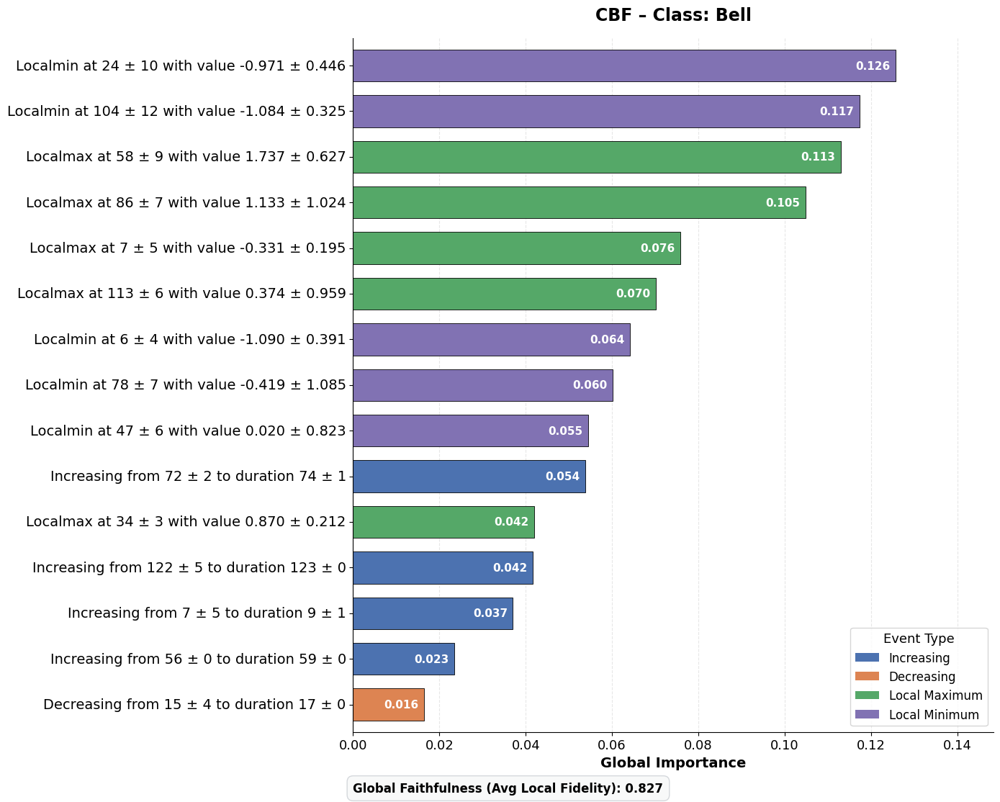

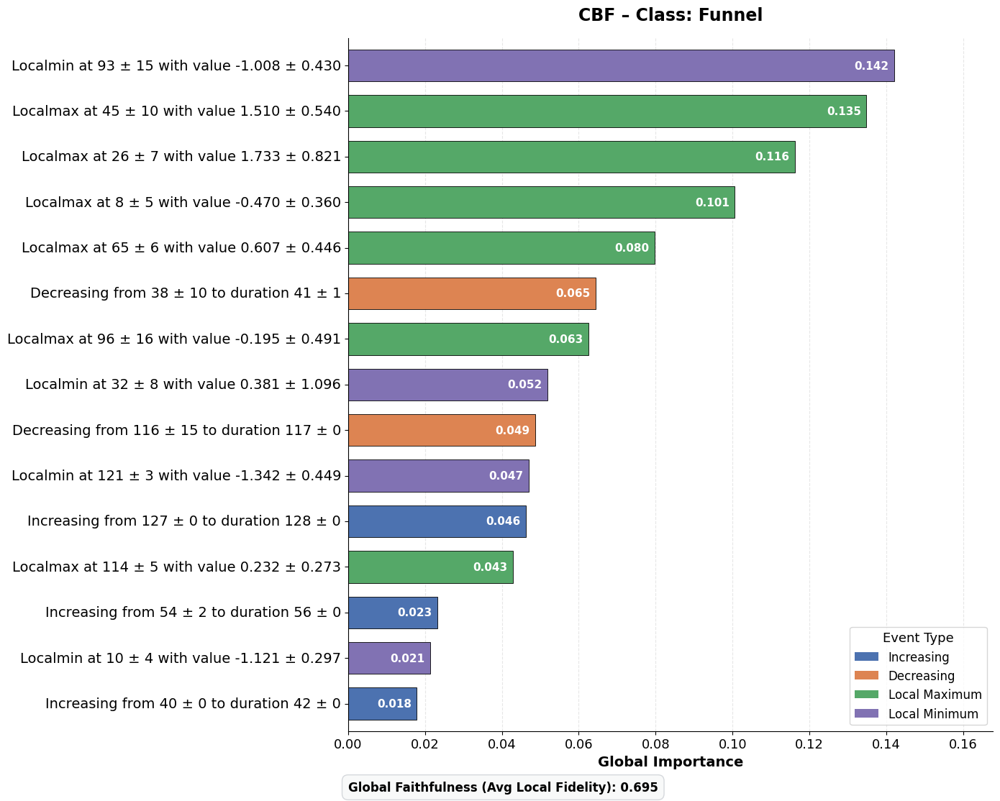

In [28]:
result_p95 = splomatce_explainer.run(X_test, y_test, n_per_class=15, B=15, merge_percentile=95)